# Species Accumulation Curve (SAC) & Poisson CI Gap Analysis

**Notebook:** `SAC/SAC array CI.ipynb`  
**Dataset:** Snapshot USA Camera Trap Data (2019–2023)  
**Purpose:** Assess sampling adequacy of camera trap arrays using a dual-metric approach:

1. **Species Accumulation Curves (SAC)** — Michaelis-Menten model fit via R's `vegan` package to estimate asymptotic richness and sampling completeness.
2. **Poisson Confidence Interval (CI) Gap** — Mussmann method to compute an upper bound on the number of undetected regularly-visiting species.

**Workflow:**
1. **Environment & Configuration** — Configure R environment, import libraries, set global options
2. **Data Loading & Exploration** — Load Snapshot USA data, inspect species observations
3. **Core Functions** — Define `get_species_matrix`, `species_accumulation`, `sac_quality`
4. **Exploratory SAC Analysis** — Single-array temporal and spatial SAC curves
5. **Method Comparison** — Define `TailProbability`, `ConfidenceMax`, and effort computation functions
6. **Per-Array-Year Pipeline** — Compute SAC + CI gap for all array-year combinations using 3 effort metrics
7. **Summary Statistics** — Exploratory visualizations comparing effort definitions and CI gap distributions
8. **Parameter Selection** — Sensitivity analysis for $t_0$ and effort metric comparison
9. **Final Results** — Type A/B/C/D classification with publication-quality visualizations

---
## 1. Environment & Configuration

Set up the R environment (for `vegan` package), import Python libraries, and define global options including the output directory for saved figures.

In [1]:
import os

# ==============================================================================
# Must set R path BEFORE importing rpy2!
# ==============================================================================
# Your Conda R environment path (please ensure this path is correct)
conda_env_path = "/home/hice1/kyan66/scratch/r_kernel"

# 1. Set R_HOME (tell Python where R's home directory is)
os.environ['R_HOME'] = f"{conda_env_path}/lib/R"

# 2. Set PATH (tell Python where R's executable commands are)
os.environ['PATH'] = f"{conda_env_path}/bin:" + os.environ.get('PATH', '')

# 3. Set LD_LIBRARY_PATH (tell Python where R's dynamic libraries are)
os.environ['LD_LIBRARY_PATH'] = f"{conda_env_path}/lib:" + os.environ.get('LD_LIBRARY_PATH', '')

print(f"✅ R environment path configured: {os.environ['R_HOME']}")

✅ R environment path configured: /home/hice1/kyan66/scratch/r_kernel/lib/R


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter
import random

In [3]:
import torch
import socket

print(f"Current hostname: {socket.gethostname()}")
print(f"Is CUDA available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    print(f"GPU name: {torch.cuda.get_device_name(0)}")
    print("🎉 Congratulations! Your uv environment successfully accessed the compute node's GPU!")
else:
    print("❌ GPU not detected. Please check the salloc command.")

Current hostname: atl1-1-02-004-15-2.pace.gatech.edu
Is CUDA available: False
❌ GPU not detected. Please check the salloc command.


In [4]:
save_dir = '../data/ssusa'
os.makedirs(save_dir, exist_ok=True)

# ==============================================================================
# Global visualization save option
# Set to True to save all figures as PNG to output/array_SAC_CI/
# ==============================================================================
save_visualization = False
output_dir = os.path.join('..', 'output', 'array_SAC_CI')
if save_visualization:
    os.makedirs(output_dir, exist_ok=True)
    print(f"✅ Figures will be saved to: {os.path.abspath(output_dir)}")
else:
    print("ℹ️ save_visualization = False — figures will not be saved to disk.")

# Show all columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

ℹ️ save_visualization = False — figures will not be saved to disk.


---
## 2. Data Loading & Exploration

Load the cleaned Snapshot USA dataset and generate a quick overview of species observations across all arrays.

In [5]:
# Define the directory path
data_dir = save_dir
df_path = data_dir + '/cleaned_snapshot_usa_iucn.csv'


In [6]:
df = pd.read_csv(df_path)

/tmp/ipykernel_2222702/2810494364.py:1: DtypeWarning: Columns (0: Sequence_ID) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(df_path)


In [7]:
df.head(10)

,Year,Project,Camera_Trap_Array,Deployment_ID,Sequence_ID,Start_Time,End_Time,Class,Order,Family,Genus,Species,Common_Name,Sci_Name,Age,Sex,Group_Size,Site_Name,Start_Date,End_Date,Survey_Nights,Latitude,Longitude,Habitat,Development_Level,Feature_Type
0,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s1,2019-08-31 06:50:00,2019-08-31 06:50:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,unknown,unknown,1,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source
1,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s2,2019-08-31 14:15:00,2019-08-31 14:17:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,unknown,unknown,1,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source
2,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s3,2019-08-31 18:22:00,2019-08-31 18:22:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,unknown,unknown,1,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source
3,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s4,2019-08-31 20:58:00,2019-08-31 20:58:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,adult,female,1,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source
4,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s4,2019-08-31 20:58:00,2019-08-31 20:58:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,juvenile,unknown,2,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source
5,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s5,2019-09-02 19:18:00,2019-09-02 19:18:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,unknown,unknown,1,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source
6,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s6,2019-09-02 19:57:00,2019-09-02 19:57:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,unknown,unknown,1,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source
7,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s7,2019-09-02 21:44:00,2019-09-02 21:44:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,unknown,unknown,1,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source
8,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s8,2019-09-02 23:44:00,2019-09-02 23:44:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,unknown,unknown,1,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source
9,2019,Snapshot USA 2019,Crupi,AK_Forest_Chilkat_Preserve_1,d58722s9,2019-09-03 06:55:00,2019-09-03 06:55:00,mammalia,carnivora,ursidae,ursus,arctos,brown bear,ursus arctos,unknown,unknown,1,AK_Forest_Crupi_21_dep_01,2019-08-31,2019-11-03,64.0,59.42643,-136.2225,forest,wild,water source


In [8]:
# Generate species observation summary
# Group by scientific name and common name, count observations
species_summary = df.groupby(['Sci_Name', 'Common_Name']).size().reset_index(name='Number_of_Observations')

# Sort by number of observations in descending order
species_summary = species_summary.sort_values('Number_of_Observations', ascending=False)

# Save to CSV
# output_path = os.path.join(save_dir, 'species_observation_summary.csv')
# species_summary.to_csv(output_path, index=False)

# print(f"✅ Species observation summary saved to: {output_path}")
print(f"\nTotal unique species: {len(species_summary)}")
print(f"Total observations: {species_summary['Number_of_Observations'].sum()}")
print(f"\nTop 10 species by observations:")
print(species_summary.head(10).to_string(index=False))


Total unique species: 113
Total observations: 698887

Top 10 species by observations:
              Sci_Name           Common_Name  Number_of_Observations
odocoileus virginianus     white-tailed deer                  227780
  sciurus carolinensis eastern gray squirrel                  182314
         procyon lotor      northern raccoon                   78186
         sciurus niger  eastern fox squirrel                   34867
         canis latrans                coyote                   20149
  didelphis virginiana      virginia opossum                   18801
   odocoileus hemionus             mule deer                   18755
       tamias striatus      eastern chipmunk                   17668
 sylvilagus floridanus    eastern cottontail                   15709
         vulpes vulpes               red fox                   11390


---
## 3. Core Functions

Define reusable functions for species matrix construction, species accumulation curve computation (via R's `vegan` package), and plotting.

In [9]:
def get_species_matrix(df, unit_col, species_col='Sci_Name'):
    """
    Converts dataframe to a presence/absence matrix (Sampling Unit x Species).
    
    Parameters:
    - df: pandas DataFrame containing the data
    - unit_col: column name for sampling unit (can be Site, Year, Location, Year_Month, etc.)
    - species_col: column name for species identification (default: 'Sci_Name')
    
    Returns:
    - Binary matrix where rows are sampling units and columns are species (1=present, 0=absent)
    """
    # Filter valid species and sampling units
    valid_data = df.dropna(subset=[species_col, unit_col])
    valid_data = valid_data[valid_data[species_col] != ""]

    # Create pivot table (Count occurrences)
    matrix = pd.crosstab(valid_data[unit_col], valid_data[species_col])

    # Convert to binary Presence/Absence (1/0)
    matrix = (matrix > 0).astype(int)

    return matrix

In [10]:
def species_accumulation(matrix, method='exact', permutations=100, 
                         conditioned=True, gamma='jack1', w=None):
    """
    Uses R's vegan::specaccum function for species accumulation.
    
    Parameters:
    - matrix: binary pandas DataFrame (Rows=Samples, Cols=Species)
    - method: Species accumulation method (partial match supported):
        * 'collector' - adds sites in the order they appear in the data
        * 'random' - adds sites in random order (uses permutations)
        * 'exact' - expected (mean) species richness using sample-based rarefaction (Mao Tau)
        * 'coleman' - expected richness following Coleman et al. 1982
        * 'rarefaction' - mean when accumulating individuals instead of sites
    - permutations: number of permutations for method='random' (default: 100)
    - conditioned: if True (default), SD for 'exact' method is conditional on empirical data
    - gamma: method for estimating total extrapolated species ('jack1', 'jack2', 'chao', 'boot')
             used for unconditional SD estimation in 'exact' method
    - w: optional weights giving sampling effort for each site (for 'random' and 'collector')

    Returns:
    - dict containing:
        * 'sites': number of sites (x-axis)
        * 'richness': species richness at each site count (y-axis)
        * 'sd': standard deviation (None for 'collector' method)
        * 'method': the method used
        * 'perm': permutation matrix (only for 'random' method, else None)
        * 'individuals': average individuals per site (only for 'rarefaction', else None)
        * 'effort': accumulated effort (only when weights used, else None)
    """
    
    # Load vegan package
    vegan = importr('vegan')
    
    # Convert pandas DataFrame to R data frame
    with localconverter(pandas2ri.converter + robjects.default_converter):
        r_matrix = pandas2ri.py2rpy(matrix)
        
        # Build keyword arguments
        kwargs = {
            'method': method,
            'permutations': permutations,
            'conditioned': conditioned,
            'gamma': gamma
        }
        
        # Add weights if provided
        if w is not None:
            kwargs['w'] = robjects.FloatVector(w)
        
        # Call vegan::specaccum
        result = vegan.specaccum(r_matrix, **kwargs)
    
    # Extract results from R object
    with localconverter(pandas2ri.converter + robjects.default_converter):
        sites = np.array(robjects.r('as.numeric')(result.rx2('sites')))
        richness = np.array(robjects.r('as.numeric')(result.rx2('richness')))
        
        # SD is NULL for 'collector' method
        try:
            sd_val = result.rx2('sd')
            if not robjects.r('is.null')(sd_val)[0]:
                sd = np.array(robjects.r('as.numeric')(sd_val))
            else:
                sd = np.zeros_like(richness)
        except Exception:
            sd = np.zeros_like(richness)
        
        # Extract permutation matrix for 'random' method
        try:
            perm_val = result.rx2('perm')
            if not robjects.r('is.null')(perm_val)[0]:
                perm = np.array(perm_val)
            else:
                perm = None
        except Exception:
            perm = None
        
        # Extract individuals for 'rarefaction' method
        try:
            ind_val = result.rx2('individuals')
            if not robjects.r('is.null')(ind_val)[0]:
                individuals = np.array(robjects.r('as.numeric')(ind_val))
            else:
                individuals = None
        except Exception:
            individuals = None
        
        # Extract effort when weights are used
        try:
            eff_val = result.rx2('effort')
            if not robjects.r('is.null')(eff_val)[0]:
                effort = np.array(robjects.r('as.numeric')(eff_val))
            else:
                effort = None
        except Exception:
            effort = None
    
    return {
        'sites': sites,
        'richness': richness,
        'sd': sd,
        'method': method,
        'perm': perm,
        'individuals': individuals,
        'effort': effort
    }


In [11]:
def plot_sac(sac_data, title, xlabel="Sampling units"):
    """Publication-quality plotting function for species accumulation curves"""
    x = sac_data['sites']
    y = sac_data['richness']
    sd = sac_data['sd']

    # Set style for publication BEFORE creating figure
    plt.style.use('seaborn-v0_8-whitegrid')

    # Create figure with higher DPI for publication quality
    _fig, ax = plt.subplots(figsize=(10, 7), dpi=300)
    
    # Plot Confidence Interval (Mean +/- 2 SD approx 95% CI)
    if sd is not None and np.any(sd > 0):
        ax.fill_between(x, y - 2*sd, y + 2*sd, 
                        color='#2E86AB', alpha=0.2, 
                        label='95% Confidence Interval',
                        edgecolor='#2E86AB', linewidth=0.5)
    
    # Plot Mean Line with markers
    ax.plot(x, y, color='#A23B72', linewidth=2.5, 
            marker='o', markersize=6, markerfacecolor='white',
            markeredgewidth=2, markeredgecolor='#A23B72',
            label='Species Richness', zorder=3)
    
    # Enhance grid
    ax.grid(True, linestyle='--', alpha=0.3, linewidth=0.8)
    ax.set_axisbelow(True)
    
    # Labels and title with better formatting
    ax.set_xlabel(xlabel, fontsize=14, fontweight='bold', labelpad=10)
    ax.set_ylabel("Accumulated Species Richness", fontsize=14, fontweight='bold', labelpad=10)
    ax.set_title(title, fontsize=16, fontweight='bold', pad=20)
    
    # Improve tick labels
    ax.tick_params(axis='both', which='major', labelsize=12, length=6, width=1.5)
    
    # Add legend with better formatting
    ax.legend(loc='lower right', frameon=True, fancybox=True, 
             shadow=True, fontsize=11, framealpha=0.95)
    
    # Set spine width
    for spine in ax.spines.values():
        spine.set_linewidth(1.5)
    
    # Tight layout for better spacing
    plt.tight_layout()
    plt.show()


---
## 4. Exploratory SAC Analysis — Single Array

Demonstrate the SAC workflow on a single camera trap array ("Herrera") at different temporal granularities (yearly, monthly) and spatial levels (by deployment site).

This section uses arrays with all 5 years of data (2019–2023) to show how the accumulation curve behaves under different sampling unit definitions.

In [12]:
# Ensure Year is integer (handle NaNs if necessary)
df = df.dropna(subset=['Year'])
df['Year'] = df['Year'].astype(int)

# Extract Arrays with 5 years of data
# R logic: group by Array, get unique years, count them
years_per_array = df[df['Camera_Trap_Array'].notna()].groupby('Camera_Trap_Array')['Year'].unique()
arrays_5_years = years_per_array[years_per_array.apply(len) == 5].index.tolist()

print(f"Found {len(arrays_5_years)} arrays with 5 years of data.")

# Filter main dataframe
df_arrays_5_years = df[df['Camera_Trap_Array'].isin(arrays_5_years)].copy()

# Add Month Column from End_Date
df_arrays_5_years['End_Date'] = pd.to_datetime(df_arrays_5_years['End_Date'])
df_arrays_5_years['Month'] = df_arrays_5_years['End_Date'].dt.strftime('%m')

print(df_arrays_5_years[['Camera_Trap_Array', 'Year', 'Month']].head())

Found 41 arrays with 5 years of data.
  Camera_Trap_Array  Year Month
0             Crupi  2019    11
1             Crupi  2019    11
2             Crupi  2019    11
3             Crupi  2019    11
4             Crupi  2019    11


Selected Camera_Trap_Array: Herrera
Matrix shape: (5, 17)


R callback write-console: 'nperm' >= set of all permutations: complete enumeration.
  
R callback write-console: Set of permutations < 'minperm'. Generating entire set.
  


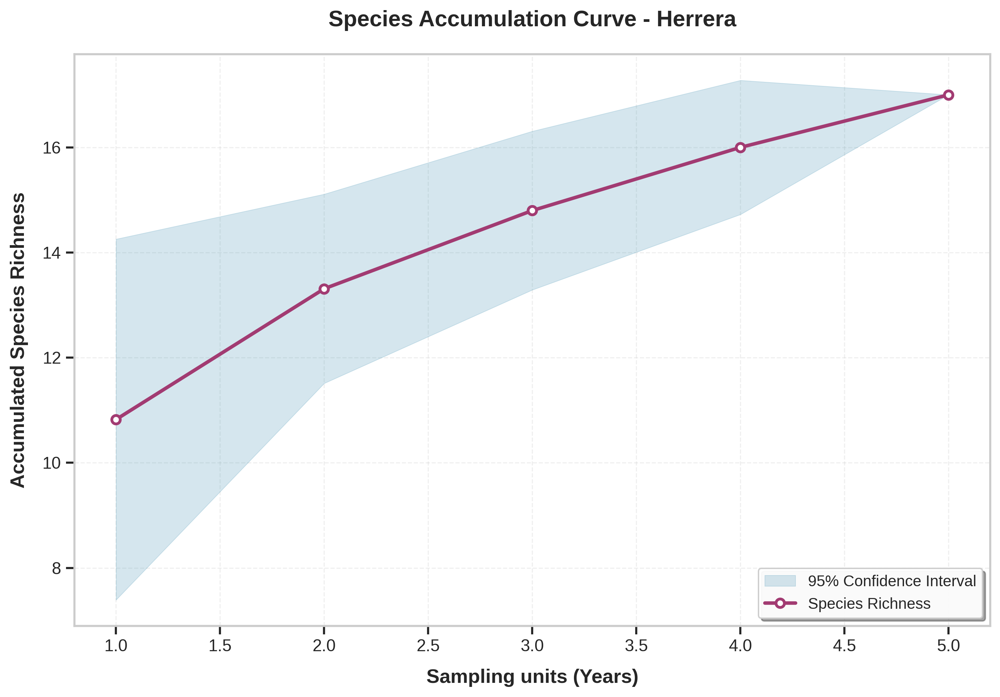

Observed richness: 17.0


In [13]:
# select array with most records (or manual selection)
selected_array = df_arrays_5_years['Camera_Trap_Array'].value_counts().idxmax()
# selected_array = "Herrera" # Manual override if needed

print(f"Selected Camera_Trap_Array: {selected_array}")

# Subset data
df_array = df_arrays_5_years[df_arrays_5_years['Camera_Trap_Array'] == selected_array]

# Create Matrix: Site = Year, Species = Sci_Name
# Note: In the R code, rows were Years.
mat_year = get_species_matrix(df_array, unit_col='Year', species_col='Sci_Name')

# Sort by index (Year) for consistent 'collector' plotting later
mat_year = mat_year.sort_index()

print(f"Matrix shape: {mat_year.shape}")

# Calculate Randomized Accumulation
acc_rand_year = species_accumulation(mat_year, method='random', permutations=1000)

# Plot
plot_sac(acc_rand_year,
         title=f"Species Accumulation Curve - {selected_array}",
         xlabel="Sampling units (Years)")

print(f"Observed richness: {acc_rand_year['richness'][-1]}")

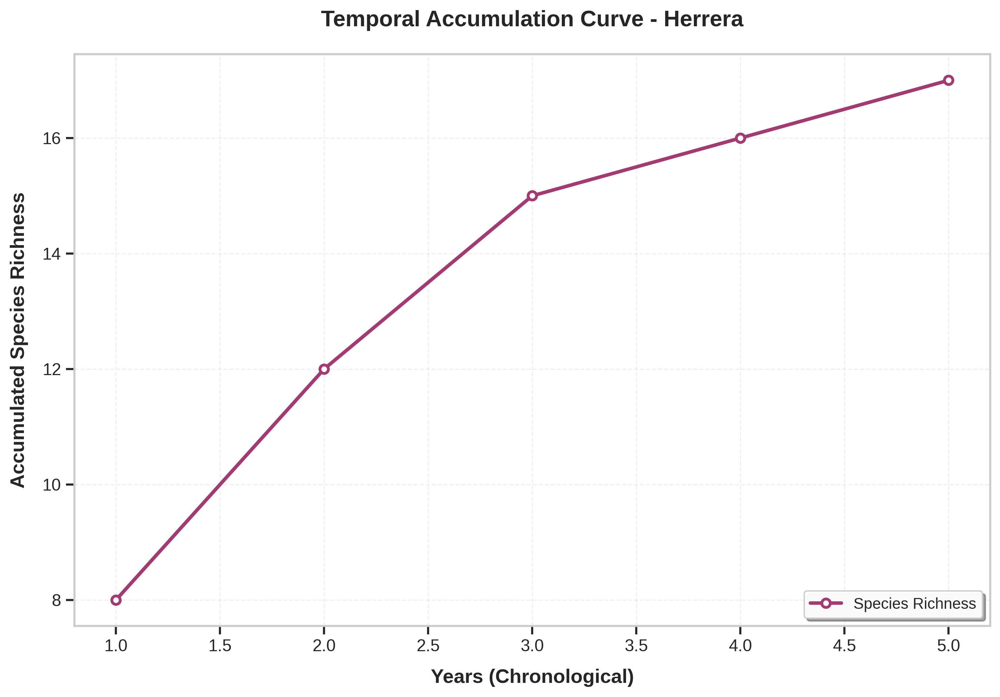

In [14]:
# Calculate Collector Accumulation
acc_col_year = species_accumulation(mat_year, method='collector')

# Plot
plot_sac(acc_col_year,
         title=f"Temporal Accumulation Curve - {selected_array}",
         xlabel="Years (Chronological)")

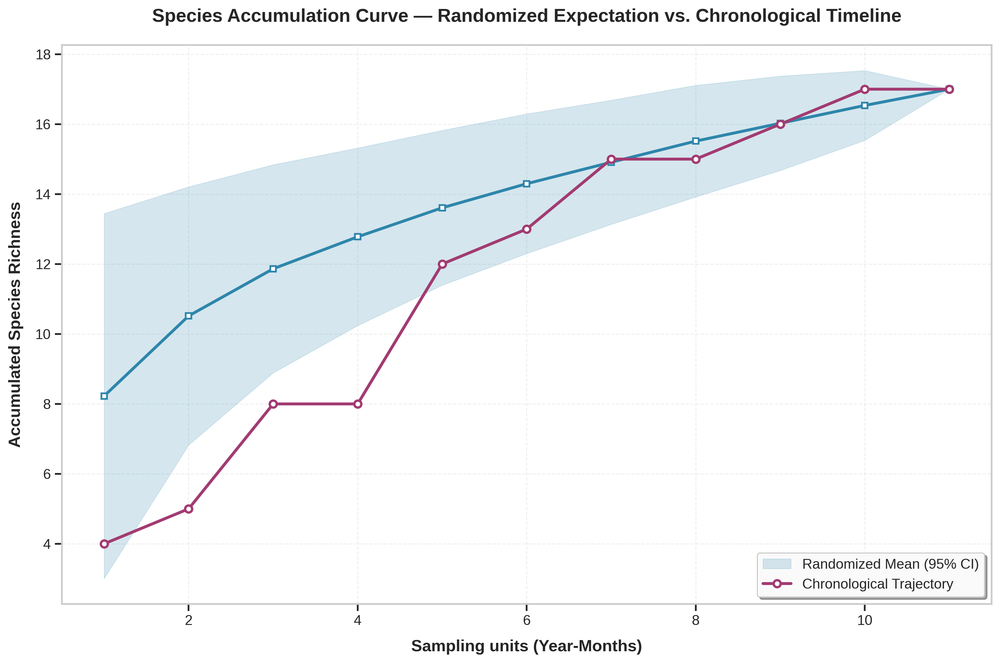

In [15]:
# Create a Year-Month column for granularity
df_array = df_array.copy() # Avoid SettingWithCopyWarning
df_array['Year_Month'] = df_array['Year'].astype(str) + "-" + df_array['Month']

# Create Matrix
mat_month = get_species_matrix(df_array, unit_col='Year_Month')
mat_month = mat_month.sort_index() # Sort chronologically

# Randomized
acc_rand_month = species_accumulation(mat_month, method='random', permutations=1000)

# Chronological
acc_time_month = species_accumulation(mat_month, method='collector')

# Combined Plot with publication-quality styling
plt.style.use('seaborn-v0_8-whitegrid')
_fig, ax = plt.subplots(figsize=(12, 8), dpi=300)

# Plot Random (with fill)
x = acc_rand_month['sites']
y = acc_rand_month['richness']
sd = acc_rand_month['sd']

# Confidence interval for randomized
ax.fill_between(x, y - 2*sd, y + 2*sd, 
                color='#2E86AB', alpha=0.2, 
                label='Randomized Mean (95% CI)',
                edgecolor='#2E86AB', linewidth=0.5)

# Randomized mean line with markers
ax.plot(x, y, color='#2E86AB', linewidth=2.5, 
        marker='s', markersize=5, markerfacecolor='white',
        markeredgewidth=1.5, markeredgecolor='#2E86AB', zorder=3)

# Plot Collector (Line + Points)
ax.plot(acc_time_month['sites'], acc_time_month['richness'],
        color='#A23B72', linewidth=2.5, 
        marker='o', markersize=6, markerfacecolor='white',
        markeredgewidth=2, markeredgecolor='#A23B72',
        label='Chronological Trajectory', zorder=3)

# Enhance grid
ax.grid(True, linestyle='--', alpha=0.3, linewidth=0.8)
ax.set_axisbelow(True)

# Labels and title with better formatting
ax.set_xlabel("Sampling units (Year-Months)", fontsize=14, fontweight='bold', labelpad=10)
ax.set_ylabel("Accumulated Species Richness", fontsize=14, fontweight='bold', labelpad=10)
ax.set_title("Species Accumulation Curve — Randomized Expectation vs. Chronological Timeline", 
             fontsize=16, fontweight='bold', pad=20)

# Improve tick labels
ax.tick_params(axis='both', which='major', labelsize=12, length=6, width=1.5)

# Add legend with better formatting
ax.legend(loc='lower right', frameon=True, fancybox=True, 
         shadow=True, fontsize=12, framealpha=0.95)

# Set spine width
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

# Tight layout for better spacing
plt.tight_layout()
plt.show()

### 4.1 Spatial Analysis
SAC by Deployment (Site) for a selected array and year

In [16]:
# Manually pick camera trap array for spatial analysis
selected_array = "Herrera"
selected_year = 2020

# Get list of deployment IDs for selected array in one year
deployment_ids = df_arrays_5_years[
    (df_arrays_5_years['Camera_Trap_Array'] == selected_array) & 
    (df_arrays_5_years['Year'] == selected_year)
]['Deployment_ID'].unique()

print(f"Selected Array: {selected_array}")
print(f"Selected Year: {selected_year}")
print(f"Number of deployments: {len(deployment_ids)}")

Selected Array: Herrera
Selected Year: 2020
Number of deployments: 143


In [17]:
# Create occurrence matrix by Deployment_ID for the selected array and year
df_selected = df_arrays_5_years[
    (df_arrays_5_years['Camera_Trap_Array'] == selected_array) & 
    (df_arrays_5_years['Year'] == selected_year)
].copy()

# Create presence/absence matrix by Deployment_ID
mat_deployment = get_species_matrix(df_selected, unit_col='Deployment_ID', species_col='Sci_Name')

print(f"Matrix shape: {mat_deployment.shape}")
mat_deployment.head()

Matrix shape: (143, 10)


Sci_Name,didelphis virginiana,marmota monax,odocoileus virginianus,peromyscus leucopus,procyon lotor,sciurus carolinensis,sciurus niger,sylvilagus floridanus,tamias striatus,vulpes vulpes
Deployment_ID,,,,,,,,,,
HH0101,0,0,1,0,1,1,0,1,0,1
HH0102,0,0,1,0,1,1,0,1,0,1
HH0103,0,0,0,0,0,1,0,0,0,1
HH0104,0,0,0,0,1,1,0,1,1,0
HH0105,0,0,0,0,1,0,0,0,0,0


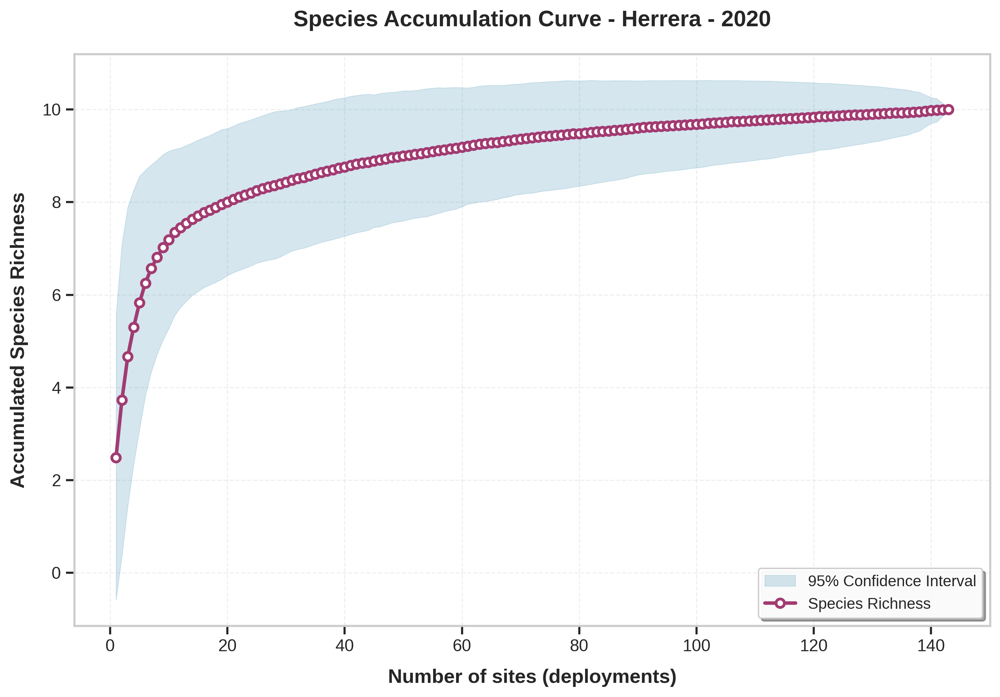

Observed richness: 10.0


In [18]:
# Species accumulation (randomized) by deployment
acc_rand_deployment = species_accumulation(mat_deployment, method='random', permutations=1000)

# Plot
plot_sac(acc_rand_deployment,
         title=f"Species Accumulation Curve - {selected_array} - {selected_year}",
         xlabel="Number of sites (deployments)")

print(f"Observed richness: {acc_rand_deployment['richness'][-1]}")

### 4.2 Site-Level SAC
Species Accumulation Curve for individual deployment sites using daily sampling units

In [19]:
def sac_for_site(df, species_col, selected_array, selected_site,
                 array_col='Camera_Trap_Array', site_col='Deployment_ID',
                 start_col='Start_Date', end_col='End_Date', end_time_col='End_Time'):
    """
    Build a species accumulation curve for a single deployment site using daily sampling units.
    
    Parameters:
    - df: pandas DataFrame containing the data
    - species_col: column name for species identification
    - selected_array: name of the camera trap array
    - selected_site: deployment ID to analyze
    - array_col, site_col, start_col, end_col, end_time_col: column names
    
    Returns:
    - dict containing 'acc_curve' (SAC data), 'matrix' (daily presence/absence), and 'info' (metadata)
    """
    # Filter to the selected array + deployment
    df_dep = df[(df[array_col] == selected_array) & (df[site_col] == selected_site)].copy()
    
    if len(df_dep) == 0:
        raise ValueError("No rows found for the selected array/deployment.")
    
    # Parse dates
    df_dep[start_col] = pd.to_datetime(df_dep[start_col])
    df_dep[end_col] = pd.to_datetime(df_dep[end_col])
    
    start_date = df_dep[start_col].min()
    end_date = df_dep[end_col].max()
    
    if pd.isna(start_date) or pd.isna(end_date) or start_date > end_date:
        raise ValueError("Invalid or missing Start_Date/End_Date for the selected deployment.")
    
    # Build full daily grid (assumes camera was out for this entire window)
    days_grid = pd.DataFrame({'Date': pd.date_range(start_date, end_date, freq='D')})
    
    # Collapse detections to daily presence per species (from End_Time)
    df_dep['End_Time_parsed'] = pd.to_datetime(df_dep[end_time_col], errors='coerce')
    df_dep['DateFromEnd'] = df_dep['End_Time_parsed'].dt.date
    
    # Get daily presence by species
    present_by_day = df_dep[
        (df_dep[species_col].notna()) & 
        (df_dep[species_col] != '') & 
        (df_dep['DateFromEnd'].notna())
    ][['DateFromEnd', species_col]].drop_duplicates()
    
    present_by_day['Date'] = pd.to_datetime(present_by_day['DateFromEnd'])
    present_by_day['present'] = 1
    
    # Pivot to wide format
    if len(present_by_day) > 0:
        pa_pivot = present_by_day.pivot_table(
            index='Date', columns=species_col, values='present', 
            fill_value=0, aggfunc='max'
        ).reset_index()
    else:
        pa_pivot = pd.DataFrame({'Date': []})
    
    # Join detections onto full sampled window
    days_grid['Date'] = pd.to_datetime(days_grid['Date'])
    if len(pa_pivot) > 0:
        pa_full = days_grid.merge(pa_pivot, on='Date', how='left').fillna(0)
    else:
        pa_full = days_grid.copy()
        pa_full['__NO_DETECTIONS__'] = 0
    
    pa_full = pa_full.sort_values('Date')
    
    # Build day x species matrix
    species_cols = [c for c in pa_full.columns if c != 'Date']
    mat_site = pa_full[species_cols].astype(int)
    mat_site.index = pa_full['Date'].dt.strftime('%Y-%m-%d')
    
    # Chronological SAC (collector uses row order as given)
    acc_curve = species_accumulation(mat_site, method='collector')
    
    return {
        'acc_curve': acc_curve,
        'matrix': mat_site,
        'info': {
            'array_id': selected_array,
            'deployment_id': selected_site,
            'trap_nights': len(mat_site),
            'n_species': len(species_cols),
            'date_range': (pa_full['Date'].min().strftime('%Y-%m-%d'), 
                          pa_full['Date'].max().strftime('%Y-%m-%d'))
        }
    }

In [20]:
# Select a specific deployment for site-level SAC
selected_array = "Herrera"
selected_site = "DC_COCanal1 09/03/2021"  # Or try "MH0704"

res = sac_for_site(df_arrays_5_years, species_col='Sci_Name',
                   selected_array=selected_array,
                   selected_site=selected_site)

print(f"Array: {res['info']['array_id']}")
print(f"Deployment: {res['info']['deployment_id']}")
print(f"Trap nights: {res['info']['trap_nights']}")
print(f"Species detected: {res['info']['n_species']}")
print(f"Date range: {res['info']['date_range']}")

Array: Herrera
Deployment: DC_COCanal1 09/03/2021
Trap nights: 29
Species detected: 5
Date range: ('2021-09-03', '2021-10-01')


In [21]:
# View the daily presence/absence matrix
res['matrix'].head(10)

,canis latrans,castor canadensis,odocoileus virginianus,procyon lotor,vulpes vulpes
Date,,,,,
2021-09-03,0,1,0,0,0
2021-09-04,0,1,1,0,1
2021-09-05,0,1,0,0,0
2021-09-06,0,1,1,0,0
2021-09-07,0,1,1,0,0
2021-09-08,0,1,1,0,0
2021-09-09,0,1,1,0,0
2021-09-10,0,1,0,0,0
2021-09-11,0,1,0,0,0


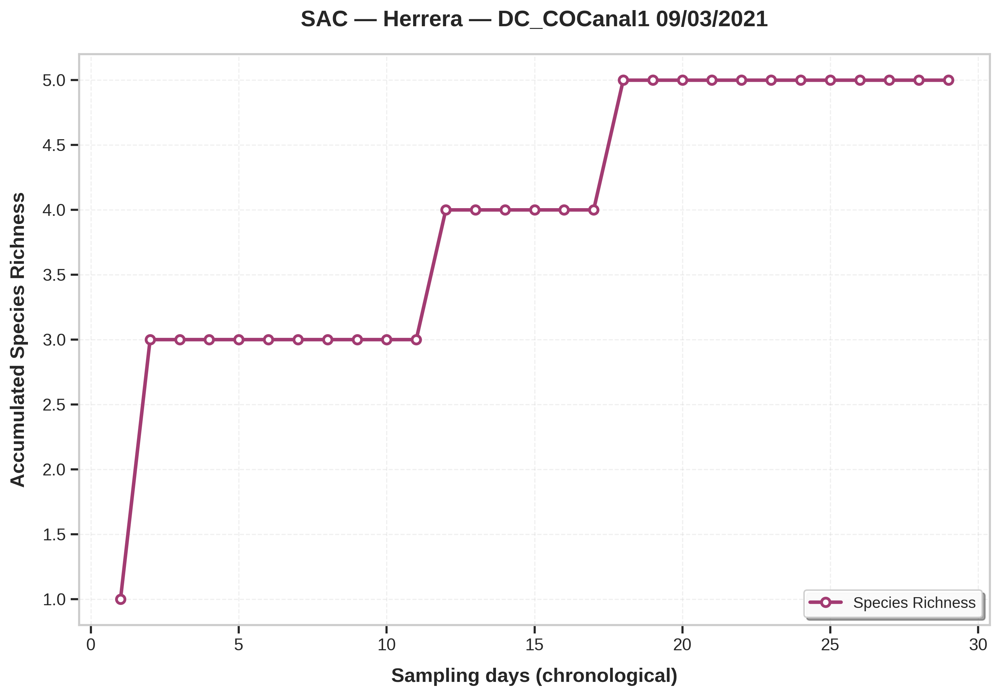

In [22]:
# Plot the site-level SAC
plot_sac(res['acc_curve'],
         title=f"SAC — {res['info']['array_id']} — {res['info']['deployment_id']}",
         xlabel="Sampling days (chronological)")

### 4.3 SAC Quality Assessment
Fit a Michaelis-Menten model to evaluate sampling completeness at the site level

In [23]:
def sac_quality(mat, target=0.90, slope_thresh=0.02, model='michaelis-menten'):
    """
    Assess SAC quality by fitting a species accumulation model using vegan::fitspecaccum.
    
    Parameters:
    - mat: presence/absence matrix (rows = effort steps, cols = species)
    - target: completeness threshold (default 0.90 = 90%)
    - slope_thresh: slope threshold for determining if curve has plateaued
    - model: model to fit. Options from vegan:
        * 'arrhenius' - power model S = c * A^z
        * 'gleason' - S = c + z * log(A)
        * 'gitay' - S = c + z * log(log(A))
        * 'lomolino' - S = Asym / (1 + slope^log(xmid/A))
        * 'asymp' - asymptotic model
        * 'gompertz' - Gompertz model
        * 'michaelis-menten' - Michaelis-Menten model (default, similar to Clench)
        * 'logis' - logistic model
        * 'weibull' - Weibull model
    
    Returns:
    - dict with completeness value, pass/fail, metrics, and model parameters
    """
    vegan = importr('vegan')
    
    # Convert matrix to R
    with localconverter(pandas2ri.converter + robjects.default_converter):
        r_matrix = pandas2ri.py2rpy(mat)
    
    # First get the specaccum object
    try:
        acc_r = vegan.specaccum(r_matrix, method='collector')
    except Exception as e:
        return {
            'value': np.nan,
            'pass': False,
            'reason': f'specaccum failed: {str(e)}',
            'metrics': {'completeness': np.nan, 'slope_last': np.nan},
            'params': {}
        }
    
    # Extract sites and richness for Python calculations
    with localconverter(pandas2ri.converter + robjects.default_converter):
        x = np.array(robjects.r('as.numeric')(acc_r.rx2('sites')))
        y = np.array(robjects.r('as.numeric')(acc_r.rx2('richness')))
    
    if len(y) < 3 or np.sum(y > 0) < 3:
        return {
            'value': np.nan,
            'pass': False,
            'reason': 'Too few positive points to fit model',
            'metrics': {'completeness': np.nan, 'slope_last': np.nan},
            'params': {}
        }
    
    # Fit the model using vegan::fitspecaccum
    try:
        fit_r = vegan.fitspecaccum(acc_r, model=model)
        
        # Extract coefficients
        with localconverter(pandas2ri.converter + robjects.default_converter):
            coefs = dict(zip(
                list(robjects.r('names')(robjects.r('coef')(fit_r))),
                list(robjects.r('as.numeric')(robjects.r('coef')(fit_r)))
            ))
            fitted_vals = np.array(robjects.r('as.numeric')(robjects.r('fitted')(fit_r)))
    except Exception as e:
        return {
            'value': np.nan,
            'pass': False,
            'reason': f'Model fitting failed: {str(e)}',
            'metrics': {'completeness': np.nan, 'slope_last': np.nan},
            'params': {}
        }
    
    # Calculate metrics based on model type
    xlast = x[-1]
    ylast = y[-1]
    
    # For Michaelis-Menten: y = Vm * x / (K + x), asymptote = Vm
    # For asymptotic models, get the asymptote parameter
    if 'Vm' in coefs:  # Michaelis-Menten
        S_inf = coefs['Vm']
        K = coefs['K']
        slope_last = (S_inf * K) / (K + xlast)**2
    elif 'Asym' in coefs:  # asymp, gompertz, logis
        S_inf = coefs['Asym']
        # Approximate slope from fitted values
        if len(fitted_vals) >= 2:
            slope_last = fitted_vals[-1] - fitted_vals[-2]
        else:
            slope_last = 0
        K = None
    else:
        # For non-asymptotic models, estimate from last fitted value
        S_inf = fitted_vals[-1] * 1.1  # rough estimate
        slope_last = (fitted_vals[-1] - fitted_vals[-2]) if len(fitted_vals) >= 2 else 0
        K = None
    
    completeness = ylast / S_inf if S_inf > 0 else np.nan
    extra_one = 1 / slope_last if slope_last > 0 else np.inf
    
    # Effort needed for 90% and 95% (for Michaelis-Menten: x = K * p / (1 - p))
    if K is not None:
        N90 = 9 * K  # K * 0.9 / 0.1
        N95 = 19 * K  # K * 0.95 / 0.05
        add90 = max(0, N90 - xlast)
        add95 = max(0, N95 - xlast)
    else:
        N90 = N95 = add90 = add95 = np.nan
    
    # Scoring
    comp_score = min(1, completeness) if not np.isnan(completeness) else 0
    slope_score = 1 - min(1, slope_last / slope_thresh) if slope_last > 0 else 1
    score = 100 * (0.7 * comp_score + 0.3 * slope_score)
    pass_test = (completeness >= target) and (slope_last <= slope_thresh)
    
    return {
        'value': completeness,
        'pass': pass_test,
        'score': score,
        'model': model,
        'metrics': {
            'completeness': completeness,
            'slope_last': slope_last,
            'extra_effort_for_plus1': extra_one,
            'effort_90pct': N90,
            'add_to_90': add90,
            'effort_95pct': N95,
            'add_to_95': add95
        },
        'params': coefs
    }

In [24]:
# Assess SAC quality for the selected site using vegan::fitspecaccum
q = sac_quality(res['matrix'], model='michaelis-menten')

print(f"Model: {q.get('model', 'N/A')}")
print(f"Completeness: {q['value']:.2%}")
print(f"Pass threshold (≥90%): {q['pass']}")
print(f"Score: {q['score']:.1f}/100")
print(f"\nDetailed metrics:")
for key, val in q['metrics'].items():
    if isinstance(val, float) and not np.isnan(val):
        print(f"  {key}: {val:.4f}")
    else:
        print(f"  {key}: {val}")
print(f"\nModel parameters (from vegan::fitspecaccum):")
for key, val in q['params'].items():
    print(f"  {key}: {val:.4f}" if isinstance(val, float) else f"  {key}: {val}")

Model: michaelis-menten
Completeness: 86.39%
Pass threshold (≥90%): False
Score: 60.5/100

Detailed metrics:
  completeness: 0.8639
  slope_last: 0.0253
  extra_effort_for_plus1: 39.4485
  effort_90pct: 45.8107
  add_to_90: 16.8107
  effort_95pct: 96.7114
  add_to_95: 67.7114

Model parameters (from vegan::fitspecaccum):
  Vm: 5.7876
  K: 5.0901


### 4.4 Plot Multiple Sites
Generate a grid of SAC plots for multiple deployments within an array

In [25]:
def plot_multiple_sites(df, species_col, selected_array, site_ids,
                        array_col='Camera_Trap_Array', site_col='Deployment_ID',
                        start_col='Start_Date', end_col='End_Date', end_time_col='End_Time',
                        ncol=3, width=5, height=5):
    """
    Plot SAC curves for multiple deployment sites in a grid layout.
    
    Parameters:
    - df: pandas DataFrame containing the data
    - species_col: column name for species identification
    - selected_array: name of the camera trap array
    - site_ids: list of deployment IDs to plot
    - ncol: number of columns in the grid
    - width, height: size of each subplot in inches
    """
    n_sites = len(site_ids)
    if n_sites == 0:
        raise ValueError("No site IDs provided")
    
    # Calculate grid dimensions
    nrow = int(np.ceil(n_sites / ncol))
    
    # Create figure
    _fig, axes = plt.subplots(nrow, ncol, figsize=(width * ncol, height * nrow), dpi=150)
    axes = np.atleast_2d(axes)  # Ensure 2D array even for single row
    
    # Plot each site
    for idx, site_id in enumerate(site_ids):
        row = idx // ncol
        col = idx % ncol
        ax = axes[row, col]
        
        try:
            res = sac_for_site(
                df=df,
                species_col=species_col,
                selected_array=selected_array,
                selected_site=site_id,
                array_col=array_col,
                site_col=site_col,
                start_col=start_col,
                end_col=end_col,
                end_time_col=end_time_col
            )
            
            x = res['acc_curve']['sites']
            y = res['acc_curve']['richness']
            
            ax.plot(x, y, color='#2E86AB', linewidth=2, marker='o', markersize=3)
            ax.set_xlabel("Days", fontsize=10)
            ax.set_ylabel("Species", fontsize=10)
            ax.set_title(f"{res['info']['deployment_id']}", fontsize=10, fontweight='bold')
            ax.grid(True, linestyle='--', alpha=0.3)
            
        except Exception:
            ax.text(0.5, 0.5, f"Error:\n{site_id}", ha='center', va='center', 
                   fontsize=8, transform=ax.transAxes)
            ax.set_xticks([])
            ax.set_yticks([])
    
    # Hide empty subplots
    for idx in range(n_sites, nrow * ncol):
        row = idx // ncol
        col = idx % ncol
        axes[row, col].axis('off')
    
    plt.suptitle(f"Species Accumulation Curves — {selected_array}", 
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

In [26]:
# Get all unique deployment IDs for Herrera array
herrera_deployments = df_arrays_5_years[
    df_arrays_5_years['Camera_Trap_Array'] == 'Herrera'
]['Deployment_ID'].unique()

print(f"Number of unique deployments in Herrera: {len(herrera_deployments)}")

Number of unique deployments in Herrera: 356


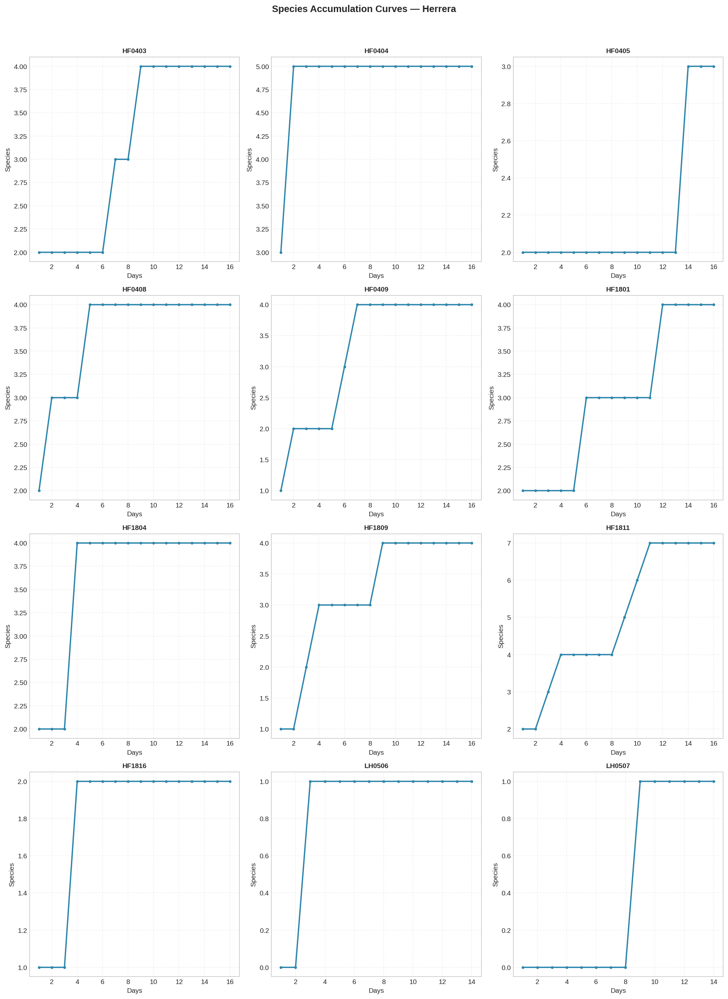

In [27]:
# Plot first 12 deployments
plot_multiple_sites(
    df=df_arrays_5_years,
    species_col='Sci_Name',
    selected_array='Herrera',
    site_ids=herrera_deployments[:12],
    ncol=3
)

In [28]:
# Find top 12 Herrera deployments with most records
top_herrera_deployments = (
    df_arrays_5_years[df_arrays_5_years['Camera_Trap_Array'] == 'Herrera']
    .groupby('Deployment_ID').size()
    .sort_values(ascending=False)
    .head(12)
    .index.tolist()
)

print(f"Top 12 deployments by record count: {top_herrera_deployments}")

Top 12 deployments by record count: ['DC_BerkshirePark 10/08/2021', 'DC_CricketGrounds 10/08/2021', 'DC_barcroftPark 10/13/2021', 'DC_Forest_Herrera_FoundryBranch 10/04/2023', 'DC_Forest_Urban_Tuckahoe 09/30/2022', 'DC_Forest_Urban_RCPboundaryBridge 10/03/2022', 'DC_Forest_Herrera_PotomacOverlookPark 10/03/2023', 'DC_Forest_Urban_RooseveltIsland 09/30/2022', 'DC_CapViewHomewoodPark 10/11/2021', 'DC_COCanal1 09/03/2021', 'DC_SligoCreekGolf 10/11/2021', 'DC_Forest_Herrera_ArmyNavyCountryClub 10/04/2023']


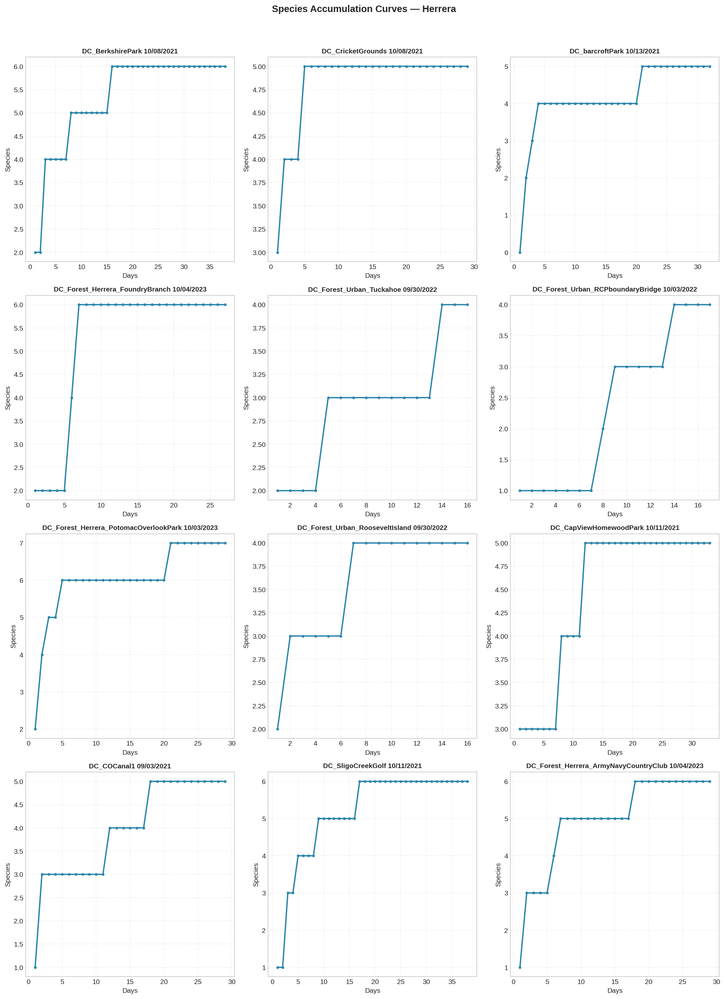

In [29]:
# Plot top 12 deployments by record count
plot_multiple_sites(
    df=df_arrays_5_years,
    species_col='Sci_Name',
    selected_array='Herrera',
    site_ids=top_herrera_deployments,
    ncol=3
)

---
## 5. Method Comparison: SAC vs. Poisson Confidence Interval (Corrected Effort)

We compare two fundamentally different approaches to assessing whether a camera trap array has been surveyed long enough to capture its species community.

### Method 1: Species Accumulation Curve + Michaelis-Menten (SAC)

The SAC approach is **curve-fitting on observed data**. As we add sampling units (deployments), we count cumulative species and fit a saturating function:

$$S(n) = \frac{V_m \cdot n}{K + n}$$

where $V_m$ is the predicted asymptotic richness and $K$ is the half-saturation constant.

### Method 2: Poisson Confidence Interval (CI Gap)

The CI method asks: *given effort $t$ and a visitation threshold $t_0$, how many regularly-visiting species could we have missed?*

Each species visits the array area according to a **Poisson process** with mean inter-visit interval $t_0$. The probability of non-detection (zero arrivals) during effort $t$ is:

$$p_0 = e^{-t/t_0}$$

We find $k_{max}$: the largest $k$ such that observing $m$ or fewer species out of $k$ true species remains plausible at the 5% level. The **CI gap** = $k_{max} - m$ represents the maximum plausible number of undetected species.

### Sampling Effort Definitions

**The problem:** The original implementation used **camera-nights** as the effort parameter $t$:
```python
t_total = df_arr.groupby('Deployment_ID')['Survey_Nights'].first().sum()
```
If an array has $N$ cameras running simultaneously for $D$ days, this gives $t = N \times D$.

**Why this is problematic:** In the Poisson model, $t_0$ is the mean inter-visit interval to the *array area*, not to a specific camera. Twenty cameras running simultaneously don't make a species visit the area more often — they increase per-visit detection probability (which is already assumed to be 1 in the Poisson framework). Using camera-nights inflates $t$ by roughly the number of simultaneous cameras, making $p_0 = e^{-t/t_0}$ vanishingly small and CI gap $\approx 0$ for virtually all arrays.

**The fix:** We compute three definitions of $t$ **per array-year** and compare them:

| Definition | Formula | Day counting rule | Ecological meaning |
|---|---|---|---|
| `t_camera` | $\sum_i \text{Survey\_Nights}_i$ for that year | N/A (sum of all) | Camera-nights (reference, inflated) |
| `t_calendar` | Unique days with $\geq 1$ active camera that year | Any camera active → count day | Surveillance time of the area |
| `t_majority` | Unique days with $> 50\%$ active cameras that year | >50% of cameras active → count day | Full-coverage surveillance days |

Each row in the results is an **(Array, Year)** combination, giving actual per-season effort rather than a median across years.

**Expected impact:** For an array-year with 20 cameras each running 35 nights simultaneously:
- `t_camera` = 700 (inflated)
- `t_calendar` ≈ 35 (count every day since all cameras are active)
- `t_majority` ≈ 35 (same, since all cameras > 50%)

When cameras have staggered or partial overlap, `t_majority < t_calendar` because days with only a few cameras active are excluded by the majority rule. When deployments run sequentially with no overlap, `t_majority = 0`.


In [30]:
import math
from scipy.stats import binom

def TailProbability(k, t_0, t, m):
    """
    Compute P(S <= m | k, t_0, t) where S ~ Binomial(k, 1 - exp(-t/t_0)).

    Parameters:
    - k: hypothesized true number of regularly visiting species
    - t_0: mean inter-visit time (defines "regular" visitation threshold)
    - t: total sampling effort (survey nights)
    - m: observed species count (unique species detected)

    Returns: cumulative probability P(observing m or fewer species out of k)
    """
    if k == 0:
        return 1.0 if m >= 0 else 0.0
    p0 = math.exp(-t / t_0)  # probability of NOT detecting a species
    p_detect = 1 - p0         # probability of detecting a species
    # Use scipy for numerical stability
    return binom.cdf(m, k, p_detect)


def ConfidenceMax(t, t_0, m, delta=0.05, k_max_cap=500):
    """
    Find upper 95% confidence bound on k (true regularly visiting species).

    Returns the largest k such that observing only m species is still
    plausible (tail probability >= delta).

    Parameters:
    - t: total sampling effort (survey nights)
    - t_0: mean inter-visit time threshold
    - m: observed species count
    - delta: significance level (default 0.05 for 95% CI)
    - k_max_cap: safety cap to prevent infinite loops
    """
    k = m  # start from observed count (k can't be less than m)
    while k <= k_max_cap:
        if TailProbability(k, t_0, t, m) < delta:
            return k - 1
        k += 1
    return k_max_cap  # hit cap


# Quick sanity check
print("Sanity check:")
print(f"  t=100, t_0=30, m=10 -> k_max = {ConfidenceMax(100, 30, 10)}")
print(f"  t=500, t_0=30, m=10 -> k_max = {ConfidenceMax(500, 30, 10)}")
print(f"  t=100, t_0=7,  m=10 -> k_max = {ConfidenceMax(100, 7, 10)}")
print(f"  t=100, t_0=90, m=10 -> k_max = {ConfidenceMax(100, 90, 10)}")

Sanity check:
  t=100, t_0=30, m=10 -> k_max = 12
  t=500, t_0=30, m=10 -> k_max = 10
  t=100, t_0=7,  m=10 -> k_max = 10
  t=100, t_0=90, m=10 -> k_max = 21


In [31]:
from collections import Counter

def calendar_nights(df_arr):
    """Count unique calendar days when at least one camera was active in the array."""
    active_days = set()
    for _, grp in df_arr.groupby('Deployment_ID'):
        start = pd.to_datetime(grp['Start_Date'].iloc[0])
        end = pd.to_datetime(grp['End_Date'].iloc[0])
        active_days.update(pd.date_range(start, end, freq='D'))
    return len(active_days)


def calendar_nights_for_year(df_year):
    """Count unique calendar days with >=1 active camera for a single year's data."""
    active_days = set()
    for _, grp_dep in df_year.groupby('Deployment_ID'):
        start = pd.to_datetime(grp_dep['Start_Date'].iloc[0])
        end = pd.to_datetime(grp_dep['End_Date'].iloc[0])
        active_days.update(pd.date_range(start, end, freq='D'))
    return len(active_days)


def calendar_nights_majority(df_arr, threshold=0.5):
    """Count calendar days when > threshold of cameras in the array are active.

    Parameters:
    - threshold: fraction (0-1) or percent (0-100). Default 0.5 = 50%.
    """
    total_deployments = df_arr['Deployment_ID'].nunique()
    if total_deployments == 0:
        return 0

    thr = threshold / 100 if threshold > 1 else threshold
    day_counts = Counter()
    for _, grp in df_arr.groupby('Deployment_ID'):
        start = pd.to_datetime(grp['Start_Date'].iloc[0])
        end = pd.to_datetime(grp['End_Date'].iloc[0])
        for day in pd.date_range(start, end, freq='D'):
            day_counts[day] += 1

    min_count = total_deployments * thr
    return sum(1 for cnt in day_counts.values() if cnt > min_count)


def calendar_nights_majority_for_year(df_year, threshold=0.5):
    """Count calendar days when > threshold of that year's cameras are active.

    Parameters:
    - threshold: fraction (0-1) or percent (0-100). Default 0.5 = 50%.
    """
    thr = threshold / 100 if threshold > 1 else threshold
    total_deployments = df_year['Deployment_ID'].nunique()
    if total_deployments == 0:
        return 0

    day_counts = Counter()
    for _, grp_dep in df_year.groupby('Deployment_ID'):
        start = pd.to_datetime(grp_dep['Start_Date'].iloc[0])
        end = pd.to_datetime(grp_dep['End_Date'].iloc[0])
        for day in pd.date_range(start, end, freq='D'):
            day_counts[day] += 1

    min_count = total_deployments * thr
    return sum(1 for cnt in day_counts.values() if cnt > min_count)


def camera_nights_for_year(df_year):
    """Sum Survey_Nights of deployments for a single year's data."""
    return df_year.groupby('Deployment_ID')['Survey_Nights'].first().sum()


# Quick test on one array
test_arr = df['Camera_Trap_Array'].dropna().unique()[0]
df_test = df[df['Camera_Trap_Array'] == test_arr]
t_cam = df_test.groupby('Deployment_ID')['Survey_Nights'].first().sum()
t_cal = calendar_nights(df_test)
t_maj = calendar_nights_majority(df_test)
n_deps = df_test['Deployment_ID'].nunique()
n_yrs = df_test['Year'].nunique()
print(f"Test array: {test_arr}  ({n_deps} deployments, {n_yrs} years)")
print(f"  t_camera (sum all nights):           {t_cam}")
print(f"  t_calendar (any cam active):         {t_cal}")
print(f"  t_majority (>50% cams active):       {t_maj}")
print(f"  Inflation factor (cam/cal): {t_cam / t_cal:.2f}x")

# Per-year breakdown
print(f"\n  Per-year breakdown:")
for year, grp_year in df_test.groupby('Year'):
    t_cam_y = camera_nights_for_year(grp_year)
    t_cal_y = calendar_nights_for_year(grp_year)
    t_maj_y = calendar_nights_majority_for_year(grp_year)
    n_dep_y = grp_year['Deployment_ID'].nunique()
    print(f"    Year {year}: t_camera={t_cam_y}, t_calendar={t_cal_y}, t_majority={t_maj_y}, n_deps={n_dep_y}")


Test array: Crupi  (47 deployments, 5 years)
  t_camera (sum all nights):           3236.0
  t_calendar (any cam active):         475
  t_majority (>50% cams active):       0
  Inflation factor (cam/cal): 6.81x

  Per-year breakdown:
    Year 2019: t_camera=538.0, t_calendar=79, t_majority=67, n_deps=8
    Year 2020: t_camera=475.0, t_calendar=95, t_majority=70, n_deps=7
    Year 2021: t_camera=885.0, t_calendar=115, t_majority=108, n_deps=10
    Year 2022: t_camera=605.0, t_calendar=90, t_majority=44, n_deps=11
    Year 2023: t_camera=733.0, t_calendar=96, t_majority=93, n_deps=11


## 6. Per-Array-Year Analysis Pipeline (Corrected Effort)
Compute SAC (Michaelis-Menten) and Poisson CI metrics for all array-year combinations using **three** definitions of sampling effort $t$.

Each row in the output represents a single **(Array, Year)** combination, so per-year effort is computed directly rather than as a median.

**Effort definitions (per array-year):**
| Definition | Formula | Ecological meaning |
|---|---|---|
| `t_camera` | $\sum_i \text{Survey\_Nights}_i$ for deployments in that year | Camera-nights for the year |
| `t_calendar` | Unique calendar days with $\geq 1$ active camera that year | Any-camera-active days |
| `t_majority` | Unique calendar days with $> 50\%$ of cameras active that year | Majority-active days (conservative) |

**Note on habitat classification:** Some arrays span multiple habitat types across their deployments.
For simplicity, each array is assigned its **dominant habitat** (the habitat with the most observations).
A `Habitat_All` field records all habitats present, and `Multi_Habitat` flags arrays with mixed coverage.


In [32]:
# Compute per-array-year summary: effort (3 definitions), observed richness, SAC quality, and CI bounds
import warnings
warnings.filterwarnings('ignore')

t0_values = [7, 14, 30, 60, 90]
t_methods = ['camera', 'calendar', 'majority']
all_arrays = df['Camera_Trap_Array'].dropna().unique()

# Count total array-years to process
total_array_years = sum(
    df[df['Camera_Trap_Array'] == arr]['Year'].dropna().nunique()
    for arr in all_arrays
)
print(f"Total arrays: {len(all_arrays)}")
print(f"Total array-years to process: {total_array_years}")

results = []
errors = []
t_majority_zero_examples = []  # Collect arrays where t_majority = 0 for investigation

counter = 0
for arr in all_arrays:
    df_arr = df[df['Camera_Trap_Array'] == arr]
    years = sorted(df_arr['Year'].dropna().unique())

    # Get habitat and location (mode/mean) — same across years for a given array
    hab_counts = df_arr['Habitat'].value_counts()
    if len(hab_counts) == 0:
        habitat = 'unknown'
        habitat_all = 'unknown'
    elif len(hab_counts) == 1:
        habitat = hab_counts.index[0]
        habitat_all = habitat
    else:
        habitat = hab_counts.index[0]  # dominant habitat
        habitat_all = ' / '.join(hab_counts.index[:3])
    lat = df_arr['Latitude'].mean()
    lon = df_arr['Longitude'].mean()

    for year in years:
        df_year = df_arr[df_arr['Year'] == year]
        counter += 1
        if counter % 100 == 0:
            print(f'  Processed {counter} array-years...')

        # --- Basic stats ---
        m_observed = df_year['Sci_Name'].nunique()
        n_deployments = df_year['Deployment_ID'].nunique()

        # --- Three effort definitions (for this year) ---
        t_camera = camera_nights_for_year(df_year)
        t_cal = calendar_nights_for_year(df_year)
        t_maj = calendar_nights_majority_for_year(df_year)

        # Collect t_majority = 0 examples for investigation
        if t_maj == 0 and t_cal > 0 and len(t_majority_zero_examples) < 3:
            t_majority_zero_examples.append({
                'array': arr, 'year': year,
                'n_deployments': n_deployments,
                't_camera': t_camera, 't_calendar': t_cal,
            })

        # Inflation factor
        n_cameras_simultaneous = t_camera / t_cal if t_cal > 0 else np.nan

        row = {
            'Array': arr,
            'Year': int(year),
            'n_deployments': n_deployments,
            'Habitat': habitat,
            'Habitat_All': habitat_all,
            'Multi_Habitat': len(hab_counts) > 1,
            'Latitude': lat,
            'Longitude': lon,
            'm_observed': m_observed,
            't_camera': t_camera,
            't_calendar': t_cal,
            't_majority': t_maj,
            'n_cameras_simultaneous': n_cameras_simultaneous,
        }

        # --- SAC: Michaelis-Menten ---
        try:
            mat = get_species_matrix(df_year, unit_col='Deployment_ID', species_col='Sci_Name')
            if mat.shape[0] >= 3 and mat.shape[1] >= 1:
                q = sac_quality(mat, model='michaelis-menten')
                row['Vm_sac'] = q['params'].get('Vm', np.nan)
                row['K_sac'] = q['params'].get('K', np.nan)
                row['completeness_sac'] = q['value']
                row['sac_score'] = q.get('score', np.nan)
            else:
                row['Vm_sac'] = row['K_sac'] = row['completeness_sac'] = row['sac_score'] = np.nan
        except Exception as e:
            row['Vm_sac'] = row['K_sac'] = row['completeness_sac'] = row['sac_score'] = np.nan
            errors.append((arr, year, 'SAC', str(e)))

        # --- Poisson CI for each t_0 AND each t definition ---
        effort_map = {
            'camera': t_camera,
            'calendar': t_cal,
            'majority': t_maj,
        }

        for method_name, t_val in effort_map.items():
            if t_val > 0 and m_observed > 0:
                for t0 in t0_values:
                    k_max = ConfidenceMax(t_val, t0, m_observed)
                    row[f'k_max_{method_name}_t{t0}'] = k_max
                    row[f'ci_gap_{method_name}_t{t0}'] = k_max - m_observed
            else:
                for t0 in t0_values:
                    row[f'k_max_{method_name}_t{t0}'] = np.nan
                    row[f'ci_gap_{method_name}_t{t0}'] = np.nan

        results.append(row)

df_results = pd.DataFrame(results)
print(f"\nProcessed {len(df_results)} array-year rows ({len(errors)} errors)")
if errors:
    print(f"First 5 errors: {errors[:5]}")


Total arrays: 261
Total array-years to process: 584


R callback write-console: Error in nls(y ~ x/(K + x), data = xy, start = list(K = abs(pars[2L]/pars[1L])),  : 
  step factor 0.000488281 reduced below 'minFactor' of 0.000976562
  
R callback write-console: Error in nls(y ~ x/(K + x), data = xy, start = list(K = abs(pars[2L]/pars[1L])),  : 
  step factor 0.000488281 reduced below 'minFactor' of 0.000976562
  
R callback write-console: Error in nls(y ~ SSmicmen(x, Vm, K), ...) : 
  number of iterations exceeded maximum of 50
  
R callback write-console: Error in nls(y ~ SSmicmen(x, Vm, K), ...) : 
  number of iterations exceeded maximum of 50
  


  Processed 100 array-years...


R callback write-console: Error in nls(y ~ x/(K + x), data = xy, start = list(K = abs(pars[2L]/pars[1L])),  : 
  step factor 0.000488281 reduced below 'minFactor' of 0.000976562
  
R callback write-console: Error in nls(y ~ x/(K + x), data = xy, start = list(K = abs(pars[2L]/pars[1L])),  : 
  step factor 0.000488281 reduced below 'minFactor' of 0.000976562
  
R callback write-console: Error in nls(y ~ x/(K + x), data = xy, start = list(K = abs(pars[2L]/pars[1L])),  : 
  step factor 0.000488281 reduced below 'minFactor' of 0.000976562
  
R callback write-console: Error in nls(y ~ SSmicmen(x, Vm, K), ...) : 
  number of iterations exceeded maximum of 50
  


  Processed 200 array-years...


R callback write-console: Error in nls(y ~ SSmicmen(x, Vm, K), ...) : 
  number of iterations exceeded maximum of 50
  
R callback write-console: Error in nls(y ~ x/(K + x), data = xy, start = list(K = abs(pars[2L]/pars[1L])),  : 
  step factor 0.000488281 reduced below 'minFactor' of 0.000976562
  


  Processed 300 array-years...


R callback write-console: Error in nls(y ~ x/(K + x), data = xy, start = list(K = abs(pars[2L]/pars[1L])),  : 
  step factor 0.000488281 reduced below 'minFactor' of 0.000976562
  


  Processed 400 array-years...


R callback write-console: Error in nls(y ~ x/(K + x), data = xy, start = list(K = abs(pars[2L]/pars[1L])),  : 
  step factor 0.000488281 reduced below 'minFactor' of 0.000976562
  


  Processed 500 array-years...


R callback write-console: Error in nls(y ~ SSmicmen(x, Vm, K), ...) : 
  number of iterations exceeded maximum of 50
  
R callback write-console: Error in nls(y ~ x/(K + x), data = xy, start = list(K = abs(pars[2L]/pars[1L])),  : 
  step factor 0.000488281 reduced below 'minFactor' of 0.000976562
  



Processed 584 array-year rows (0 errors)


In [33]:
# Investigate array-years where t_majority = 0 (deployments with little/no temporal overlap)
if t_majority_zero_examples:
    print(f"{'='*80}")
    print(f"INVESTIGATING t_majority = 0 ({len(t_majority_zero_examples)} examples)")
    print(f"{'='*80}")
    for ex in t_majority_zero_examples:
        arr_name = ex['array']
        yr = ex['year']
        df_debug = df[(df['Camera_Trap_Array'] == arr_name) & (df['Year'] == yr)]
        n_deps = df_debug['Deployment_ID'].nunique()
        min_count_needed = n_deps * 0.5

        # Count how many cameras active each day
        day_counts = Counter()
        for _, grp in df_debug.groupby('Deployment_ID'):
            start = pd.to_datetime(grp['Start_Date'].iloc[0])
            end = pd.to_datetime(grp['End_Date'].iloc[0])
            for day in pd.date_range(start, end, freq='D'):
                day_counts[day] += 1

        if day_counts:
            max_overlap = max(day_counts.values())
            mean_overlap = np.mean(list(day_counts.values()))
        else:
            max_overlap = mean_overlap = 0

        print(f"\n  Array: {arr_name}, Year: {yr}")
        print(f"    n_deployments: {n_deps}")
        print(f"    t_camera: {ex['t_camera']}, t_calendar: {ex['t_calendar']}")
        print(f"    Threshold for majority: cnt > {min_count_needed:.1f} (i.e., need {int(min_count_needed)+1}+ cameras)")
        print(f"    Max cameras active on any day: {max_overlap}")
        print(f"    Mean cameras active per day: {mean_overlap:.2f}")
        print(f"    -> t_majority = 0 because max overlap ({max_overlap}) <= threshold ({min_count_needed:.1f})")
        print(f"    This means deployments have little/no temporal overlap.")
else:
    print("No array-years with t_majority = 0 found.")


INVESTIGATING t_majority = 0 (3 examples)

  Array: Storrs, Year: 2021
    n_deployments: 20
    t_camera: 681.0, t_calendar: 75
    Threshold for majority: cnt > 10.0 (i.e., need 11+ cameras)
    Max cameras active on any day: 10
    Mean cameras active per day: 9.35
    -> t_majority = 0 because max overlap (10) <= threshold (10.0)
    This means deployments have little/no temporal overlap.

  Array: Storrs, Year: 2023
    n_deployments: 23
    t_camera: 726.0, t_calendar: 82
    Threshold for majority: cnt > 11.5 (i.e., need 12+ cameras)
    Max cameras active on any day: 11
    Mean cameras active per day: 9.13
    -> t_majority = 0 because max overlap (11) <= threshold (11.5)
    This means deployments have little/no temporal overlap.

  Array: Herrera, Year: 2019
    n_deployments: 24
    t_camera: 347.0, t_calendar: 66
    Threshold for majority: cnt > 12.0 (i.e., need 13+ cameras)
    Max cameras active on any day: 10
    Mean cameras active per day: 5.62
    -> t_majority = 0 

In [34]:
# Display results summary with the three effort definitions (per array-year)
display_cols = ['Array', 'Year', 'n_deployments', 'm_observed',
                't_camera', 't_calendar', 't_majority',
                'n_cameras_simultaneous',
                'Vm_sac', 'completeness_sac', 'Habitat',
                'ci_gap_camera_t30', 'ci_gap_calendar_t30', 'ci_gap_majority_t30']
print(f"Results shape: {df_results.shape}")
print(f"Columns: {list(df_results.columns)}")
df_results[display_cols].head(15)


Results shape: (584, 47)
Columns: ['Array', 'Year', 'n_deployments', 'Habitat', 'Habitat_All', 'Multi_Habitat', 'Latitude', 'Longitude', 'm_observed', 't_camera', 't_calendar', 't_majority', 'n_cameras_simultaneous', 'Vm_sac', 'K_sac', 'completeness_sac', 'sac_score', 'k_max_camera_t7', 'ci_gap_camera_t7', 'k_max_camera_t14', 'ci_gap_camera_t14', 'k_max_camera_t30', 'ci_gap_camera_t30', 'k_max_camera_t60', 'ci_gap_camera_t60', 'k_max_camera_t90', 'ci_gap_camera_t90', 'k_max_calendar_t7', 'ci_gap_calendar_t7', 'k_max_calendar_t14', 'ci_gap_calendar_t14', 'k_max_calendar_t30', 'ci_gap_calendar_t30', 'k_max_calendar_t60', 'ci_gap_calendar_t60', 'k_max_calendar_t90', 'ci_gap_calendar_t90', 'k_max_majority_t7', 'ci_gap_majority_t7', 'k_max_majority_t14', 'ci_gap_majority_t14', 'k_max_majority_t30', 'ci_gap_majority_t30', 'k_max_majority_t60', 'ci_gap_majority_t60', 'k_max_majority_t90', 'ci_gap_majority_t90']


,Array,Year,n_deployments,m_observed,t_camera,t_calendar,t_majority,n_cameras_simultaneous,Vm_sac,completeness_sac,Habitat,ci_gap_camera_t30,ci_gap_calendar_t30,ci_gap_majority_t30
0,Crupi,2019,8,7,538.0,79,67,6.810127,9.402525,0.744481,forest,0,2,3.0
1,Crupi,2020,7,5,475.0,95,70,5.000000,4.741424,1.054536,forest,0,1,2.0
2,Crupi,2021,10,7,885.0,115,108,7.695652,6.590620,1.062116,forest,0,1,1.0
3,Crupi,2022,11,8,605.0,90,44,6.722222,32.617990,0.245263,forest,0,2,6.0
4,Crupi,2023,11,8,733.0,96,93,7.635417,8.401817,0.952175,forest,0,2,2.0
5,Fantle-Lepczyk,2019,25,9,563.0,26,25,21.653846,9.997129,0.900258,forest,0,14,14.0
6,Fantle-Lepczyk,2020,14,11,560.0,46,43,12.173913,12.153759,0.905070,forest,0,7,8.0
7,Fantle-Lepczyk,2021,16,11,950.0,63,62,15.079365,11.956426,0.920007,forest,0,4,4.0
8,Fantle-Lepczyk,2022,15,10,965.0,68,67,14.191176,10.941628,0.913941,forest,0,3,4.0
9,Fantle-Lepczyk,2023,16,10,844.0,56,56,15.071429,10.188508,0.981498,forest,0,5,5.0


---
## 7. Summary Statistics & Exploratory Visualizations

### 7.1 Effort Comparison and CI Gap Distributions
We compare the three effort definitions (per array-year) and their impact on CI gap estimates.


In [35]:
# Summary statistics: effort comparison and CI gap distributions (3 effort methods, per array-year)
valid = df_results.dropna(subset=['completeness_sac', 'k_max_calendar_t30']).copy()

print('=' * 90)
print('EFFORT CALCULATION COMPARISON (3 methods, per array-year)')
print('=' * 90)

# Effort comparison
fmt3 = '{:<22s} {:>14s} {:>14s} {:>14s}'
print('\n' + fmt3.format('', 'Camera-nights', 'Calendar(any)', 'Majority(>50%)'))
print('-' * 66)
print('{:<22s} {:>14.1f} {:>14.1f} {:>14.1f}'.format(
    'Mean t:',
    df_results['t_camera'].mean(),
    df_results['t_calendar'].mean(),
    df_results['t_majority'].mean()))
print('{:<22s} {:>14.1f} {:>14.1f} {:>14.1f}'.format(
    'Median t:',
    df_results['t_camera'].median(),
    df_results['t_calendar'].median(),
    df_results['t_majority'].median()))

infl_cal = (df_results['t_camera'] / df_results['t_calendar']).replace([np.inf, -np.inf], np.nan)
ratio_maj_cal = (df_results['t_majority'] / df_results['t_calendar']).replace([np.inf, -np.inf, 0], np.nan)
print('{:<22s} {:>14s} {:>13.2f}x {:>14s}'.format(
    'Inflation (cam/cal):', '--', infl_cal.mean(), 'N/A'))
print('{:<22s} {:>14s} {:>14s} {:>14s}'.format(
    'Majority/Calendar:', '', '', f'{ratio_maj_cal.mean():.2%}'))

# t_majority = 0 stats
n_maj_zero = (df_results['t_majority'] == 0).sum()
n_total = len(df_results)
print(f'\n  Array-years with t_majority = 0: {n_maj_zero}/{n_total} ({100*n_maj_zero/n_total:.1f}%)')

# CI Gap distributions for selected t0 values
for t0 in [30, 60, 90]:
    header = f'\nCI GAP DISTRIBUTION (t0 = {t0})'
    print(header)
    print(fmt3.format('', 'Camera-nights', 'Calendar(any)', 'Majority(>50%)'))
    print('-' * 66)

    gap_cam = df_results[f'ci_gap_camera_t{t0}'].dropna()
    gap_cal = df_results[f'ci_gap_calendar_t{t0}'].dropna()
    gap_maj = df_results[f'ci_gap_majority_t{t0}'].dropna()

    print('{:<22s} {:>14.1f} {:>14.1f} {:>14.1f}'.format(
        'Mean CI gap:', gap_cam.mean(), gap_cal.mean(), gap_maj.mean()))
    print('{:<22s} {:>14.0f} {:>14.0f} {:>14.0f}'.format(
        'Median CI gap:', gap_cam.median(), gap_cal.median(), gap_maj.median()))
    print('{:<22s} {:>13.1f}% {:>13.1f}% {:>13.1f}%'.format(
        '% rows gap = 0:', 100*(gap_cam==0).mean(), 100*(gap_cal==0).mean(), 100*(gap_maj==0).mean()))
    print('{:<22s} {:>13.1f}% {:>13.1f}% {:>13.1f}%'.format(
        '% rows gap > 0:', 100*(gap_cam>0).mean(), 100*(gap_cal>0).mean(), 100*(gap_maj>0).mean()))
    print('{:<22s} {:>13.1f}% {:>13.1f}% {:>13.1f}%'.format(
        '% rows gap > 5:', 100*(gap_cam>5).mean(), 100*(gap_cal>5).mean(), 100*(gap_maj>5).mean()))
    print('{:<22s} {:>14.0f} {:>14.0f} {:>14.0f}'.format(
        'Max CI gap:', gap_cam.max(), gap_cal.max(), gap_maj.max()))

# Adequacy agreement with SAC (3 methods)
print('\n' + '=' * 90)
print('ADEQUACY AGREEMENT WITH SAC')
print('=' * 90)
afmt = '{:<40s} {:>10s} {:>10s} {:>10s}'
print('\n' + afmt.format('', 'Camera', 'Cal(any)', 'Maj>50%'))
print('-' * 72)
for t0 in [30, 60]:
    sac_ok = valid['completeness_sac'] >= 0.90
    for label, sac_cond, gap_zero in [
        (f'SAC >= 90% AND gap = 0 (t0={t0}):', sac_ok, True),
        (f'SAC >= 90% AND gap > 0 (t0={t0}):', sac_ok, False),
        (f'SAC < 90% AND gap = 0 (t0={t0}):', ~sac_ok, True),
        (f'SAC < 90% AND gap > 0 (t0={t0}):', ~sac_ok, False),
    ]:
        vals = []
        for method in ['camera', 'calendar', 'majority']:
            gap_col = f'ci_gap_{method}_t{t0}'
            if gap_col in valid.columns:
                if gap_zero:
                    count = (sac_cond & (valid[gap_col] == 0)).sum()
                else:
                    count = (sac_cond & (valid[gap_col] > 0)).sum()
            else:
                count = 0
            vals.append(count)
        print('{:<40s} {:>10d} {:>10d} {:>10d}'.format(label, *vals))
    print()


EFFORT CALCULATION COMPARISON (3 methods, per array-year)

                        Camera-nights  Calendar(any) Majority(>50%)
------------------------------------------------------------------
Mean t:                         619.3           59.1           43.8
Median t:                       519.5           58.0           46.0
Inflation (cam/cal):               --         10.90x            N/A
Majority/Calendar:                                           79.38%

  Array-years with t_majority = 0: 18/584 (3.1%)

CI GAP DISTRIBUTION (t0 = 30)
                        Camera-nights  Calendar(any) Majority(>50%)
------------------------------------------------------------------
Mean CI gap:                      0.0            5.5           24.2
Median CI gap:                      0              5              7
% rows gap = 0:                 99.0%           0.0%           0.0%
% rows gap > 0:                  1.0%         100.0%         100.0%
% rows gap > 5:                  0.0%         

### 7.2 Interpretation of Effort Comparison

**Three definitions of sampling effort $t$ (per array-year):**

| Definition | How it is computed | Primary use |
|---|---|---|
| `t_camera` | Sum of camera-nights for all deployments in that array-year | Reference/baseline (inflated by number of simultaneous cameras) |
| `t_calendar` | Count distinct days when **any** camera in the array is active that year | Surveillance time of the area |
| `t_majority` | Count distinct days when **>50%** of cameras in the array are active that year | Conservative: full-array coverage days |

**Why per array-year?**

Each row in `df_results` represents one **(Array, Year)** combination. This gives the actual effort in each individual survey season, rather than collapsing across years with a median. You can always aggregate across years later with `df_results.groupby('Array')`.

**Why `t_majority` can be 0:**

`t_majority` uses strict greater-than: a day counts only if `cameras_active > total_deployments * 0.5`. For arrays where deployments run sequentially (no temporal overlap), the max cameras active on any day equals 1, which never exceeds the threshold when `total_deployments >= 2`. This is the **correct** behavior — it means the array never had majority spatial coverage on any day.

**Which `t` definition should be primary?**

`t_calendar` (any-camera calendar-nights) should serve as the primary effort metric because it correctly represents the total time the array area was under surveillance. The Poisson model assumes species visit the *area* at rate $1/t_0$ — multiple cameras increase the probability of photographing a passing animal, but the Poisson non-detection framework already assumes detection probability equals 1 given a visit. Thus, effort should count *how long* the area was monitored, not how many cameras were watching simultaneously.

**Type C arrays (false plateaus):**

Array-years where SAC completeness $\geq 90\%$ but CI gap > 0 are the most methodologically interesting. These represent "false plateaus" — the SAC curve appears to have leveled off (suggesting adequate sampling), but the Poisson model indicates that the total surveillance effort was insufficient to confidently rule out undetected regular visitors.


### 7.3 Comparative Visualizations
Publication-quality figures comparing effort definitions and their impact on CI gap estimates.

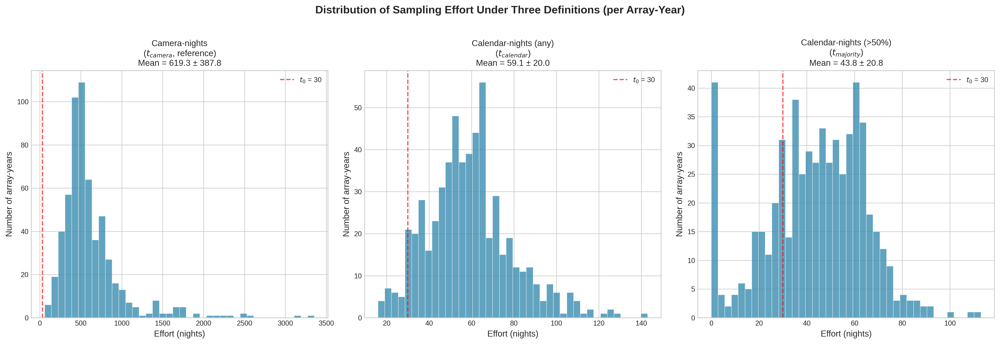

In [36]:
# Figure A: Effort Comparison Histogram (3-panel, per array-year)
plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=300)

effort_data = [
    ('t_camera', 'Camera-nights\n($t_{camera}$, reference)'),
    ('t_calendar', 'Calendar-nights (any)\n($t_{calendar}$)'),
    ('t_majority', 'Calendar-nights (>50%)\n($t_{majority}$)'),
]

for i, (col, title) in enumerate(effort_data):
    ax = axes[i]
    vals = df_results[col].dropna()
    ax.hist(vals, bins=40, color='#2E86AB', alpha=0.75, edgecolor='white', linewidth=0.5)
    ax.axvline(30, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='$t_0$ = 30')
    ax.set_xlabel('Effort (nights)', fontsize=11)
    ax.set_ylabel('Number of array-years', fontsize=11)
    mean_val = vals.mean()
    sd_val = vals.std()
    ax.set_title(f'{title}\nMean = {mean_val:.1f} ± {sd_val:.1f}', fontsize=11)
    ax.tick_params(labelsize=9)
    ax.legend(fontsize=9)

fig.suptitle('Distribution of Sampling Effort Under Three Definitions (per Array-Year)',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_A_effort_comparison.png'), dpi=300, bbox_inches='tight')
plt.show()


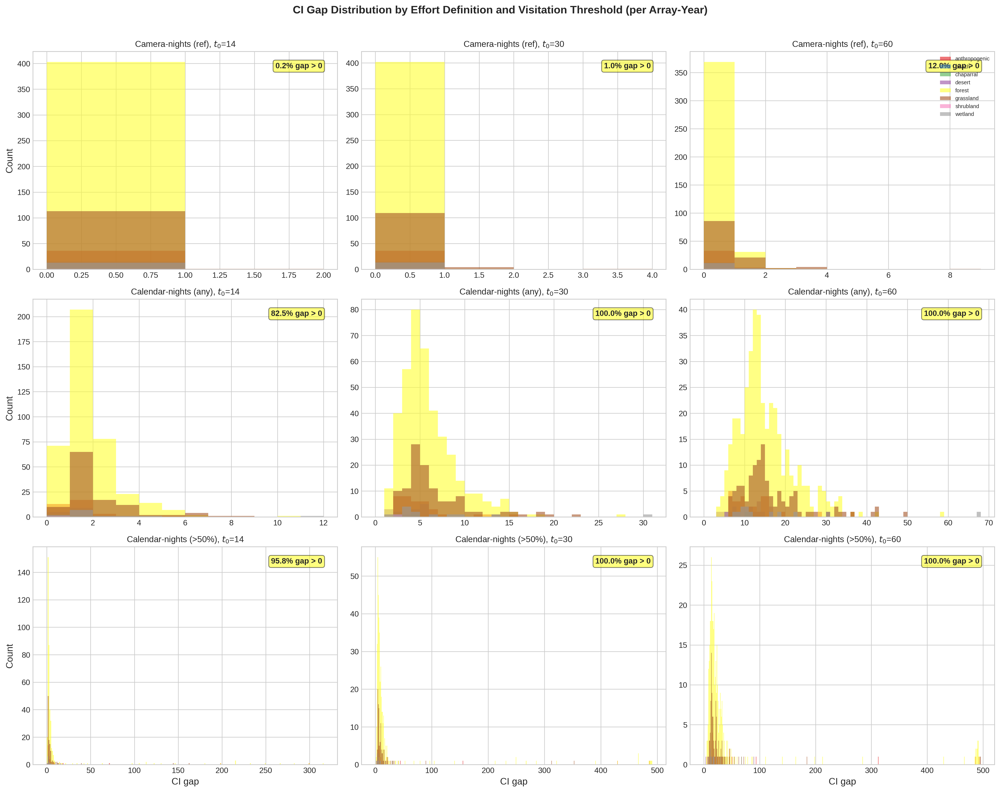

In [37]:
# Figure B: CI Gap Comparison Across t Definitions (3x3 grid, per array-year)
plt.style.use('seaborn-v0_8-whitegrid')

t0_cols = [14, 30, 60]
method_labels = [
    ('camera', 'Camera-nights (ref)'),
    ('calendar', 'Calendar-nights (any)'),
    ('majority', 'Calendar-nights (>50%)'),
]

# Consistent habitat colors
habitats = sorted(df_results['Habitat'].dropna().unique())
cmap_vals = plt.cm.Set1(np.linspace(0, 1, max(len(habitats), 2)))
hab_color_map = dict(zip(habitats, cmap_vals))

fig, axes = plt.subplots(3, 3, figsize=(18, 14), dpi=300)

for row_i, (method, method_label) in enumerate(method_labels):
    for col_i, t0 in enumerate(t0_cols):
        ax = axes[row_i, col_i]
        gap_col = f'ci_gap_{method}_t{t0}'

        plot_data = df_results.dropna(subset=[gap_col, 'Habitat'])
        max_gap = int(plot_data[gap_col].max()) + 2 if len(plot_data) > 0 else 10

        # Stacked histogram by habitat
        for hab in habitats:
            sub = plot_data[plot_data['Habitat'] == hab]
            if len(sub) > 0:
                ax.hist(sub[gap_col], bins=range(0, max_gap),
                        alpha=0.6, color=hab_color_map[hab], label=hab)

        pct_gt0 = 100 * (plot_data[gap_col] > 0).mean() if len(plot_data) > 0 else 0
        ax.annotate(f'{pct_gt0:.1f}% gap > 0', xy=(0.95, 0.95), xycoords='axes fraction',
                    ha='right', va='top', fontsize=10, fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.5))

        ax.set_xlabel('CI gap' if row_i == 2 else '', fontsize=12)
        ax.set_ylabel('Count' if col_i == 0 else '', fontsize=12)
        ax.set_title(f'{method_label}, $t_0$={t0}', fontsize=11)
        ax.tick_params(labelsize=10)

# Add legend to first panel
axes[0, 2].legend(fontsize=7, loc='upper right')

fig.suptitle('CI Gap Distribution by Effort Definition and Visitation Threshold (per Array-Year)',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_B_ci_gap_comparison.png'), dpi=300, bbox_inches='tight')
plt.show()


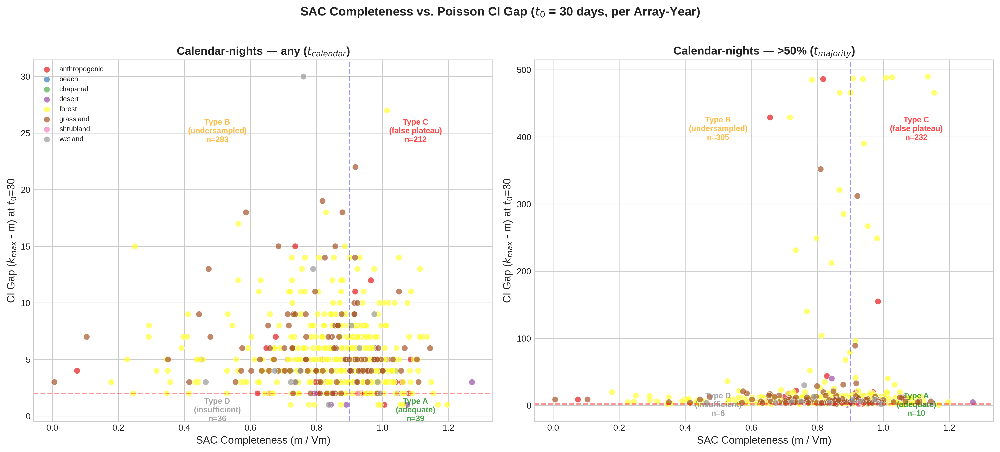

In [41]:
# Figure C: SAC Completeness vs CI Gap Scatter (MAIN FIGURE — 2 panels)
plt.style.use('seaborn-v0_8-whitegrid')

fig, axes = plt.subplots(1, 2, figsize=(16, 7), dpi=300)

# Ensure habitats and color map are defined (also computed in Figure B)
habitats = sorted(df_results['Habitat'].dropna().unique())
cmap_vals = plt.cm.Set1(np.linspace(0, 1, max(len(habitats), 2)))
hab_color_map = dict(zip(habitats, cmap_vals))

panels = [
    ('calendar', 'Calendar-nights — any ($t_{calendar}$)'),
    ('majority', 'Calendar-nights — >50% ($t_{majority}$)'),
]

for ax_i, (method, title) in enumerate(panels):
    ax = axes[ax_i]
    gap_col = f'ci_gap_{method}_t30'

    plot_df = df_results.dropna(subset=['completeness_sac', gap_col, 'Habitat']).copy()
    plot_df['completeness_sac_clipped'] = plot_df['completeness_sac'].clip(0, 1.5)

    # Scatter by habitat
    for hab in habitats:
        sub = plot_df[plot_df['Habitat'] == hab]
        ax.scatter(sub['completeness_sac_clipped'], sub[gap_col],
                   label=hab, alpha=0.7, s=50, color=hab_color_map[hab],
                   edgecolors='white', linewidth=0.5)

    # Quadrant lines
    ax.axvline(0.90, color='blue', alpha=0.4, linestyle='--', linewidth=1.5)
    ax.axhline(2, color='red', alpha=0.4, linestyle='--', linewidth=1.5)

    # Count array-years in each quadrant
    A = ((plot_df['completeness_sac'] >= 0.90) & (plot_df[gap_col] <= 2)).sum()
    B = ((plot_df['completeness_sac'] < 0.90) & (plot_df[gap_col] > 2)).sum()
    C = ((plot_df['completeness_sac'] >= 0.90) & (plot_df[gap_col] > 2)).sum()
    D = ((plot_df['completeness_sac'] < 0.90) & (plot_df[gap_col] <= 2)).sum()

    ylim = ax.get_ylim()

    # Label quadrants
    ax.text(1.1, 0.5, f'Type A\n(adequate)\nn={A}', fontsize=9, ha='center', va='center',
            color='green', fontweight='bold', alpha=0.7)
    ax.text(0.5, max(ylim[1]*0.8, 5), f'Type B\n(undersampled)\nn={B}', fontsize=9, ha='center', va='center',
            color='orange', fontweight='bold', alpha=0.7)
    ax.text(1.1, max(ylim[1]*0.8, 5), f'Type C\n(false plateau)\nn={C}', fontsize=9, ha='center', va='center',
            color='red', fontweight='bold', alpha=0.7)
    ax.text(0.5, 0.5, f'Type D\n(insufficient)\nn={D}', fontsize=9, ha='center', va='center',
            color='gray', fontweight='bold', alpha=0.7)

    ax.set_xlabel('SAC Completeness (m / Vm)', fontsize=12)
    ax.set_ylabel('CI Gap ($k_{max}$ - m) at $t_0$=30', fontsize=12)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.tick_params(labelsize=10)
    if ax_i == 0:
        ax.legend(fontsize=8, loc='upper left', framealpha=0.9)

fig.suptitle('SAC Completeness vs. Poisson CI Gap ($t_0$ = 30 days, per Array-Year)',
             fontsize=14, fontweight='bold', y=1.02)

plt.tight_layout()

if save_visualization:
        fig.savefig(os.path.join(output_dir, 'figure_C_sac_vs_cigap.png'), dpi=300, bbox_inches='tight')
plt.show()

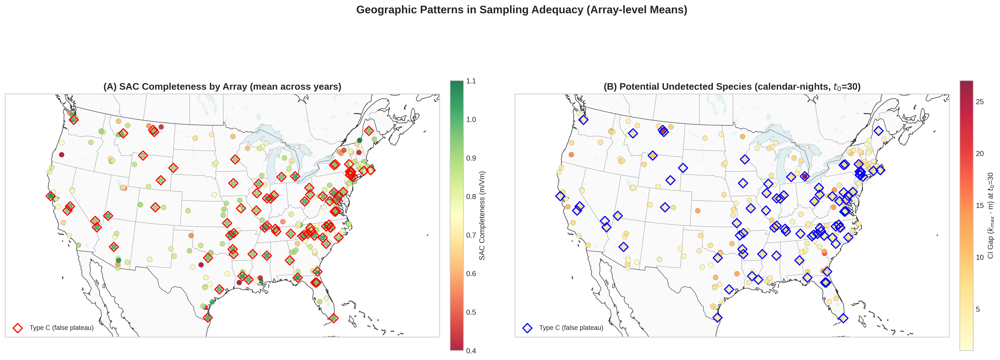

In [42]:
# Figure D: Spatial Map of CI Gap (aggregated to array level by taking mean across years)
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Aggregate per-array-year data to per-array for mapping
map_agg = df_results.groupby('Array').agg(
    Latitude=('Latitude', 'mean'),
    Longitude=('Longitude', 'mean'),
    completeness_sac=('completeness_sac', 'mean'),
    ci_gap_calendar_t30=('ci_gap_calendar_t30', 'mean'),
).dropna()

# Identify Type C arrays (mean SAC >= 90% but mean CI gap > 2)
map_agg['type_c'] = (map_agg['completeness_sac'] >= 0.90) & (map_agg['ci_gap_calendar_t30'] > 2)

plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(1, 2, figsize=(20, 8), dpi=300,
                         subplot_kw={'projection': ccrs.AlbersEqualArea(
                             central_longitude=-96, central_latitude=37.5)})

for ax in axes:
    ax.set_extent([-125, -66, 24, 50], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.STATES, edgecolor='gray', linewidth=0.5, alpha=0.5)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, alpha=0.7)
    ax.add_feature(cfeature.BORDERS, linewidth=0.8, alpha=0.5)
    ax.add_feature(cfeature.LAND, facecolor='#f0f0f0', alpha=0.3)
    ax.add_feature(cfeature.LAKES, facecolor='lightblue', alpha=0.3)

# Panel A: SAC completeness
ax = axes[0]
sc = ax.scatter(map_agg['Longitude'].values, map_agg['Latitude'].values,
                c=map_agg['completeness_sac'].clip(0, 1.2).values, cmap='RdYlGn',
                s=50, alpha=0.85, edgecolors='gray', linewidth=0.3,
                vmin=0.4, vmax=1.1, transform=ccrs.PlateCarree(), zorder=5)
tc = map_agg[map_agg['type_c']]
if len(tc) > 0:
    ax.scatter(tc['Longitude'].values, tc['Latitude'].values,
               marker='D', s=80, facecolors='none', edgecolors='red', linewidth=1.5,
               transform=ccrs.PlateCarree(), zorder=6, label='Type C (false plateau)')
    ax.legend(fontsize=9, loc='lower left')
plt.colorbar(sc, ax=ax, label='SAC Completeness (m/Vm)', shrink=0.7, pad=0.02)
ax.set_title('(A) SAC Completeness by Array (mean across years)', fontsize=13, fontweight='bold')

# Panel B: CI gap (calendar-nights, t0=30)
ax = axes[1]
sc = ax.scatter(map_agg['Longitude'].values, map_agg['Latitude'].values,
                c=map_agg['ci_gap_calendar_t30'].values, cmap='YlOrRd',
                s=50, alpha=0.85, edgecolors='gray', linewidth=0.3,
                transform=ccrs.PlateCarree(), zorder=5)
if len(tc) > 0:
    ax.scatter(tc['Longitude'].values, tc['Latitude'].values,
               marker='D', s=80, facecolors='none', edgecolors='blue', linewidth=1.5,
               transform=ccrs.PlateCarree(), zorder=6, label='Type C (false plateau)')
    ax.legend(fontsize=9, loc='lower left')
plt.colorbar(sc, ax=ax, label='CI Gap ($k_{max}$ - m) at $t_0$=30', shrink=0.7, pad=0.02)
ax.set_title('(B) Potential Undetected Species (calendar-nights, $t_0$=30)', fontsize=13, fontweight='bold')

fig.suptitle('Geographic Patterns in Sampling Adequacy (Array-level Means)', fontsize=15, fontweight='bold', y=0.98)
plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_D_spatial_map.png'), dpi=300, bbox_inches='tight')
plt.show()


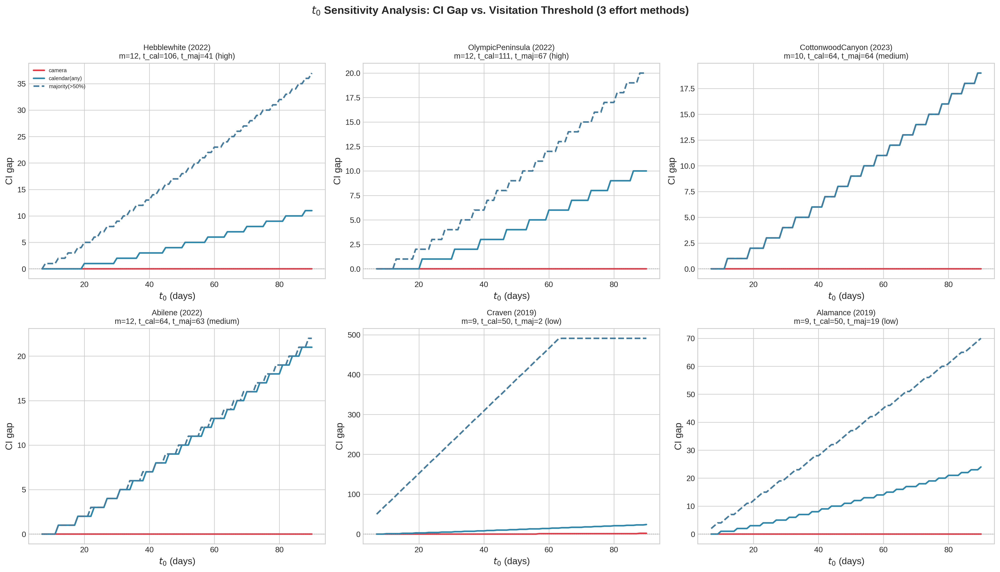

In [43]:
# Figure E: t0 Sensitivity Analysis for 6 representative array-years (3 effort methods)
plt.style.use('seaborn-v0_8-whitegrid')

# Select 6 representative array-years: 2 high-effort, 2 medium-effort, 2 low-effort
valid_for_selection = df_results.dropna(subset=['Vm_sac', 't_calendar']).copy()
valid_for_selection = valid_for_selection.sort_values('t_calendar')
n = len(valid_for_selection)

# Pick from quantile ranges
low_effort = valid_for_selection.iloc[:n//3].sample(2, random_state=42)
mid_effort = valid_for_selection.iloc[n//3:2*n//3].sample(2, random_state=42)
high_effort = valid_for_selection.iloc[2*n//3:].sample(2, random_state=42)
selected = pd.concat([high_effort, mid_effort, low_effort])

fig, axes = plt.subplots(2, 3, figsize=(18, 10), dpi=300)
t0_range = np.arange(7, 91)

for idx, (_, row_data) in enumerate(selected.iterrows()):
    ax = axes[idx // 3, idx % 3]
    arr_name = row_data['Array']
    yr = int(row_data['Year'])
    m = int(row_data['m_observed'])

    for method, t_col, color, ls, lw in [
        ('camera',           't_camera',    '#E63946', '-',  2),
        ('calendar(any)',    't_calendar',  '#2E86AB', '-',  2),
        ('majority(>50%)',   't_majority',  '#457B9D', '--', 2),
    ]:
        t_val = row_data[t_col]
        if t_val > 0 and m > 0:
            gaps = [ConfidenceMax(t_val, t0, m) - m for t0 in t0_range]
            ax.plot(t0_range, gaps, color=color, linestyle=ls, linewidth=lw, label=method)

    ax.axhline(0, color='gray', linestyle=':', linewidth=1, alpha=0.5)
    ax.set_xlabel('$t_0$ (days)', fontsize=12)
    ax.set_ylabel('CI gap', fontsize=12)
    t_cal = row_data['t_calendar']
    t_maj = row_data['t_majority']
    effort_label = 'high' if idx < 2 else ('medium' if idx < 4 else 'low')
    ax.set_title(f'{arr_name} ({yr})\nm={m}, t_cal={t_cal:.0f}, t_maj={t_maj:.0f} ({effort_label})', fontsize=10)
    ax.tick_params(labelsize=10)
    if idx == 0:
        ax.legend(fontsize=7, loc='upper left')

fig.suptitle('$t_0$ Sensitivity Analysis: CI Gap vs. Visitation Threshold (3 effort methods)',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_E_t0_sensitivity.png'), dpi=300, bbox_inches='tight')
plt.show()


### 7.4 Key Findings

**Quantitative summary:**
The corrected effort calculation (calendar-nights per array-year) reveals substantially more array-years with non-zero CI gaps compared to the inflated camera-nights metric. Under calendar-nights at $t_0 = 30$ days, a meaningful fraction show CI gap > 0, indicating that the Poisson model identifies potentially undetected regular visitors that the inflated effort previously masked.

**The critical $t_0$ concept:**
For each array-year, there exists a "critical $t_0$" -- the visitation frequency threshold at which the CI gap transitions from 0 to > 0. Array-years with lower surveillance effort have lower critical $t_0$ values, meaning they can only reliably detect the most frequent visitors. The sensitivity analysis (Figure E) reveals that this transition point varies substantially and depends critically on which effort definition is used.

**Type C array-years (false plateaus):**
Array-years where SAC completeness $\geq 90\%$ but CI gap > 0 represent the most concerning category. Their SAC curves have plateaued, suggesting adequate sampling, but the Poisson model indicates that total surveillance time was insufficient to rule out undetected regular visitors.

**Why `t_majority` can be 0:**
The majority threshold requires `> 50%` of cameras active on a given day. Arrays with sequentially deployed cameras (no temporal overlap) will have `t_majority = 0` because no single day ever has more than half the cameras running. This is correct behavior — it means the array never operated at majority spatial coverage.

**Implications for Snapshot USA network design:**
1. Camera-nights is an inappropriate effort metric for the Poisson CI method — it systematically inflates effort by the number of simultaneous cameras.
2. Calendar-nights per year provides the most ecologically relevant single-season effort estimate for network planning.
3. The per-array-year structure allows tracking how effort and detection change across survey seasons.
4. Future survey designs should target calendar-nights sufficient to achieve CI gap = 0 at the desired $t_0$ threshold for the habitat type.


### 7.5 Extended Analysis

Deeper investigation into habitat effects, correlation between effort and CI gap, and characterization of Type C (false plateau) arrays.

In [44]:
# Extended summary: habitat effects, correlation analysis (3 effort methods, per array-year)
from scipy.stats import pearsonr, spearmanr

valid = df_results.dropna(subset=['completeness_sac', 'ci_gap_calendar_t30']).copy()

print('=' * 100)
print('EXTENDED ANALYSIS (per array-year)')
print('=' * 100)

# 1. Habitat breakdown (calendar + majority)
print(f"\n1. HABITAT-LEVEL COMPARISON (t0=30)")
header = '{:<18s} {:>4s} {:>9s} {:>7s} {:>7s} {:>7s} {:>7s} {:>9s}'.format(
    'Habitat', 'n', 'SAC_comp', 'gap_cal', 'gap_maj', 't_cal', 't_maj', 'Inflation')
print(header)
print('-' * 80)
for hab, grp in valid.groupby('Habitat'):
    infl = (grp['t_camera'] / grp['t_calendar']).replace([np.inf, -np.inf], np.nan).mean()
    gap_cal = grp['ci_gap_calendar_t30'].mean()
    gap_maj = grp['ci_gap_majority_t30'].mean() if 'ci_gap_majority_t30' in grp.columns else 0
    print('{:<18s} {:>4d} {:>9.2%} {:>7.1f} {:>7.1f} {:>7.0f} {:>7.0f} {:>8.1f}x'.format(
        hab, len(grp), grp['completeness_sac'].mean(),
        gap_cal, gap_maj, grp['t_calendar'].mean(),
        grp['t_majority'].mean(), infl))

# 2. Correlation: effort vs CI gap
print(f"\n2. EFFORT vs. CI GAP CORRELATION (Spearman, t0=30)")
for method, t_col in [('camera', 't_camera'),
                       ('calendar', 't_calendar'),
                       ('majority', 't_majority')]:
    gap_col = f'ci_gap_{method}_t30'
    sub = df_results.dropna(subset=[t_col, gap_col])
    if len(sub) > 3:
        r, p = spearmanr(sub[t_col], sub[gap_col])
        print(f"   r({method:>15s} effort, CI gap): {r:>7.3f} (p={p:.4f})")

# 3. Type C array-years detail
print(f"\n3. TYPE C ARRAY-YEARS (SAC >= 90%, CI gap > 2, calendar-nights t0=30)")
type_c = valid[(valid['completeness_sac'] >= 0.90) & (valid['ci_gap_calendar_t30'] > 2)]
if len(type_c) > 0:
    print(f"   Found {len(type_c)} Type C array-years:")
    for _, r in type_c.sort_values('ci_gap_calendar_t30', ascending=False).head(10).iterrows():
        gap_maj = r.get('ci_gap_majority_t30', np.nan)
        gap_maj_str = f'{gap_maj:.0f}' if not pd.isna(gap_maj) else 'N/A'
        print(f"   {r['Array']:<25s} Year={int(r['Year'])}  SAC={r['completeness_sac']:.2%}  "
              f"gap_cal={r['ci_gap_calendar_t30']:.0f}  gap_maj={gap_maj_str}  "
              f"t_cal={r['t_calendar']:.0f}  t_maj={r['t_majority']:.0f}  "
              f"m={r['m_observed']}  habitat={r['Habitat']}")
else:
    print("   No Type C array-years found at this threshold.")

# 4. Summary across all t0 values (3 methods)
print(f"\n4. CI GAP SUMMARY ACROSS t0")
print('{:>6s} {:>10s} {:>10s} {:>10s} {:>10s}'.format(
    't0', 'cam mean', 'cal mean', 'cal %gap>0', 'maj mean'))
print('-' * 50)
for t0 in t0_values:
    col_cam = f'ci_gap_camera_t{t0}'
    col_cal = f'ci_gap_calendar_t{t0}'
    col_maj = f'ci_gap_majority_t{t0}'
    s0 = df_results[col_cam].dropna()
    sc = df_results[col_cal].dropna()
    sm = df_results[col_maj].dropna()
    print('{:>6d} {:>10.1f} {:>10.1f} {:>9.1f}% {:>10.1f}'.format(
        t0, s0.mean(), sc.mean(), 100*(sc>0).mean(), sm.mean()))

# 5. Year-over-year summary (new with per-array-year data)
print(f"\n5. YEAR-OVER-YEAR EFFORT SUMMARY")
print('{:>6s} {:>8s} {:>10s} {:>10s} {:>10s} {:>10s} {:>10s}'.format(
    'Year', 'n_rows', 't_cam', 't_cal', 't_maj', 'm_obs', 'gap_cal30'))
print('-' * 66)
for year, grp in df_results.groupby('Year'):
    gap_cal = grp['ci_gap_calendar_t30'].dropna()
    print('{:>6d} {:>8d} {:>10.1f} {:>10.1f} {:>10.1f} {:>10.1f} {:>10.1f}'.format(
        int(year), len(grp),
        grp['t_camera'].mean(), grp['t_calendar'].mean(), grp['t_majority'].mean(),
        grp['m_observed'].mean(), gap_cal.mean() if len(gap_cal) > 0 else 0))


EXTENDED ANALYSIS (per array-year)

1. HABITAT-LEVEL COMPARISON (t0=30)
Habitat               n  SAC_comp gap_cal gap_maj   t_cal   t_maj Inflation
--------------------------------------------------------------------------------
anthropogenic        36    85.90%     4.4    39.6      65      40     12.2x
beach                 1   104.14%     4.0     4.0      62      54      7.5x
chaparral             1    72.17%     4.0     4.0      65      62      8.9x
desert               15    91.16%     3.5     8.1      71      51      8.0x
forest              396    84.79%     5.5    27.1      60      44     10.9x
grassland           107    81.27%     6.1    15.4      53      42     11.4x
shrubland             1    92.51%     2.0     2.0      91      83      8.6x
wetland              13    80.97%     6.8     7.8      60      47     11.6x

2. EFFORT vs. CI GAP CORRELATION (Spearman, t0=30)
   r(         camera effort, CI gap):  -0.175 (p=0.0000)
   r(       calendar effort, CI gap):  -0.915 (p=0.000

---
## 8. Parameter Selection

Systematic evaluation of two key free parameters:

1. **Visitation threshold $t_0$** — sweep from 7 to 120 days, classify array-years into Types A/B/C/D, and select the $t_0$ that keeps false-plateau risk (Type C) below 5%.
2. **Effort metric** — compare camera-nights, calendar-nights, and majority-nights at the chosen $t_0 = 14$ to determine which effort definition is most appropriate for the Poisson CI gap method.

Type classification across t0 (n = 570 valid array-years, effort = t_calendar)
   t0   Type A   Type B   Type C   Type D      %A      %B      %C      %D
------------------------------------------------------------------------
    7      250        1        1      318   43.9%    0.2%    0.2%   55.8%
   14      226       49       25      270   39.6%    8.6%    4.4%   47.4%
   30       39      283      212       36    6.8%   49.6%   37.2%    6.3%
   60        0      319      251        0    0.0%   56.0%   44.0%    0.0%
   90        0      319      251        0    0.0%   56.0%   44.0%    0.0%
  120        0      319      251        0    0.0%   56.0%   44.0%    0.0%

SUGGESTED t0 = 7 days
  Criterion: first t0 where Type C (false plateau) <= 5% of array-years
  At t0 = 7:
    Type A (adequate):        250  (43.9%)
    Type B (undersampled):      1  (0.2%)
    Type C (false plateau):     1  (0.2%)
    Type D (insufficient):    318  (55.8%)

  Interpretation:
  At t0 = 7 days, a 'regularly vi

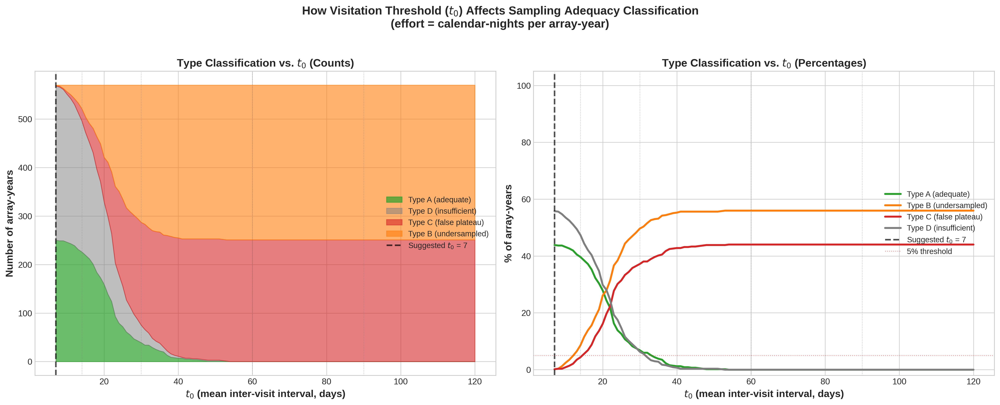

In [45]:
# =============================================================================
# Type A/B/C/D classification across t0 values (using t_calendar effort)
# =============================================================================
# Type A: SAC >= 90% AND CI gap <= 2  (adequate)
# Type B: SAC <  90% AND CI gap >  2  (undersampled)
# Type C: SAC >= 90% AND CI gap >  2  (false plateau)
# Type D: SAC <  90% AND CI gap <= 2  (insufficient SAC, but CI says OK)

t0_sweep = list(range(7, 121))  # sweep from 7 to 120 days

# Only use rows with valid SAC + calendar CI
valid_sweep = df_results.dropna(subset=['completeness_sac', 'ci_gap_calendar_t30']).copy()
n_valid = len(valid_sweep)
sac_ok = valid_sweep['completeness_sac'] >= 0.90

# For each t0, recompute k_max and CI gap using t_calendar, then classify
type_counts = {'t0': [], 'A': [], 'B': [], 'C': [], 'D': []}

for t0 in t0_sweep:
    gaps = valid_sweep.apply(
        lambda row: ConfidenceMax(row['t_calendar'], t0, int(row['m_observed'])) - row['m_observed']
        if row['t_calendar'] > 0 and row['m_observed'] > 0 else np.nan, axis=1
    )
    type_a = (sac_ok & (gaps <= 2)).sum()
    type_b = (~sac_ok & (gaps > 2)).sum()
    type_c = (sac_ok & (gaps > 2)).sum()
    type_d = (~sac_ok & (gaps <= 2)).sum()
    type_counts['t0'].append(t0)
    type_counts['A'].append(type_a)
    type_counts['B'].append(type_b)
    type_counts['C'].append(type_c)
    type_counts['D'].append(type_d)

df_types = pd.DataFrame(type_counts)

# ---- Print summary table for the original t0_values ----
print(f"Type classification across t0 (n = {n_valid} valid array-years, effort = t_calendar)")
print(f"{'t0':>5s} {'Type A':>8s} {'Type B':>8s} {'Type C':>8s} {'Type D':>8s} {'%A':>7s} {'%B':>7s} {'%C':>7s} {'%D':>7s}")
print('-' * 72)
for _, row in df_types[df_types['t0'].isin(t0_values + [120])].iterrows():
    t0 = int(row['t0'])
    a, b, c, d = int(row['A']), int(row['B']), int(row['C']), int(row['D'])
    total = a + b + c + d
    print(f"{t0:>5d} {a:>8d} {b:>8d} {c:>8d} {d:>8d} {100*a/total:>6.1f}% {100*b/total:>6.1f}% {100*c/total:>6.1f}% {100*d/total:>6.1f}%")

# ---- Suggest best t0 ----
# Criterion: maximize Type A (adequate) while keeping Type C (false plateau) low.
# A good t0 is where Type C stabilizes near 0 but Type A is still large.
# We look for the t0 where Type C first drops to <= 5% of valid array-years.
df_types['pct_C'] = 100 * df_types['C'] / n_valid
df_types['pct_A'] = 100 * df_types['A'] / n_valid
df_types['pct_B'] = 100 * df_types['B'] / n_valid

# Find t0 where Type C <= 5%
c_threshold = 5.0
candidates = df_types[df_types['pct_C'] <= c_threshold]
if len(candidates) > 0:
    best_t0 = candidates.iloc[0]['t0']
    best_row = candidates.iloc[0]
else:
    # If C never drops below 5%, pick t0 that minimizes C
    best_idx = df_types['C'].idxmin()
    best_t0 = df_types.loc[best_idx, 't0']
    best_row = df_types.loc[best_idx]

print(f"\n{'='*72}")
print(f"SUGGESTED t0 = {int(best_t0)} days")
print(f"{'='*72}")
print(f"  Criterion: first t0 where Type C (false plateau) <= {c_threshold:.0f}% of array-years")
print(f"  At t0 = {int(best_t0)}:")
print(f"    Type A (adequate):       {int(best_row['A']):>4d}  ({best_row['pct_A']:.1f}%)")
print(f"    Type B (undersampled):   {int(best_row['B']):>4d}  ({best_row['pct_B']:.1f}%)")
print(f"    Type C (false plateau):  {int(best_row['C']):>4d}  ({best_row['pct_C']:.1f}%)")
print(f"    Type D (insufficient):   {int(best_row['D']):>4d}  ({100*best_row['D']/n_valid:.1f}%)")

print(f"\n  Interpretation:")
print(f"  At t0 = {int(best_t0)} days, a 'regularly visiting' species is one expected to")
print(f"  visit the array area at least once every {int(best_t0)} days. This threshold")
print(f"  balances sensitivity (detecting infrequent visitors) with confidence")
print(f"  (minimizing false-plateau risk).")
print(f"  Lower t0 values are more conservative (flag more arrays as inadequate),")
print(f"  higher values are more lenient (accept more arrays as adequate).")

# ---- Stacked area plot ----
plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(1, 2, figsize=(18, 7), dpi=300)

# Panel 1: Stacked area (counts)
ax = axes[0]
ax.fill_between(df_types['t0'], 0, df_types['A'], color='#2ca02c', alpha=0.7, label='Type A (adequate)')
ax.fill_between(df_types['t0'], df_types['A'], df_types['A']+df_types['D'], color='#7f7f7f', alpha=0.5, label='Type D (insufficient)')
ax.fill_between(df_types['t0'], df_types['A']+df_types['D'],
                df_types['A']+df_types['D']+df_types['C'], color='#d62728', alpha=0.6, label='Type C (false plateau)')
ax.fill_between(df_types['t0'], df_types['A']+df_types['D']+df_types['C'],
                df_types['A']+df_types['D']+df_types['C']+df_types['B'], color='#ff7f0e', alpha=0.6, label='Type B (undersampled)')
ax.axvline(best_t0, color='black', linestyle='--', linewidth=2, alpha=0.7, label=f'Suggested $t_0$ = {int(best_t0)}')
for t0_v in t0_values:
    ax.axvline(t0_v, color='gray', linestyle=':', linewidth=0.8, alpha=0.5)
ax.set_xlabel('$t_0$ (mean inter-visit interval, days)', fontsize=13, fontweight='bold')
ax.set_ylabel('Number of array-years', fontsize=13, fontweight='bold')
ax.set_title('Type Classification vs. $t_0$ (Counts)', fontsize=14, fontweight='bold')
ax.legend(loc='center right', fontsize=10, framealpha=0.9)
ax.tick_params(labelsize=11)

# Panel 2: Percentage lines
ax = axes[1]
ax.plot(df_types['t0'], df_types['pct_A'], color='#2ca02c', linewidth=2.5, label='Type A (adequate)')
ax.plot(df_types['t0'], df_types['pct_B'], color='#ff7f0e', linewidth=2.5, label='Type B (undersampled)')
ax.plot(df_types['t0'], df_types['pct_C'], color='#d62728', linewidth=2.5, label='Type C (false plateau)')
ax.plot(df_types['t0'], 100*df_types['D']/n_valid, color='#7f7f7f', linewidth=2.5, label='Type D (insufficient)')
ax.axvline(best_t0, color='black', linestyle='--', linewidth=2, alpha=0.7, label=f'Suggested $t_0$ = {int(best_t0)}')
ax.axhline(c_threshold, color='#d62728', linestyle=':', linewidth=1, alpha=0.5, label=f'{c_threshold:.0f}% threshold')
for t0_v in t0_values:
    ax.axvline(t0_v, color='gray', linestyle=':', linewidth=0.8, alpha=0.5)
ax.set_xlabel('$t_0$ (mean inter-visit interval, days)', fontsize=13, fontweight='bold')
ax.set_ylabel('% of array-years', fontsize=13, fontweight='bold')
ax.set_title('Type Classification vs. $t_0$ (Percentages)', fontsize=14, fontweight='bold')
ax.legend(loc='center right', fontsize=10, framealpha=0.9)
ax.tick_params(labelsize=11)
ax.set_ylim(-2, 105)

fig.suptitle('How Visitation Threshold ($t_0$) Affects Sampling Adequacy Classification\n(effort = calendar-nights per array-year)',
             fontsize=15, fontweight='bold', y=1.03)
plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_t0_sweep.png'), dpi=300, bbox_inches='tight')

plt.show()

EFFORT METRIC COMPARISON  |  t0 = 14 days
Valid array-years with SAC completeness: 570

                          Camera-nights  Cal-nights(any) Maj-nights(>50%)
------------------------------------------------------------------------
Type A (adequate)          251 ( 44.0%)     226 ( 39.6%)     167 ( 30.2%)
Type B (undersampled)        0 (  0.0%)      49 (  8.6%)     117 ( 21.2%)
Type C (false plateau)       0 (  0.0%)      25 (  4.4%)      75 ( 13.6%)
Type D (insufficient)      319 ( 56.0%)     270 ( 47.4%)     194 ( 35.1%)
------------------------------------------------------------------------

Effort stats              Camera-nights  Cal-nights(any) Maj-nights(>50%)
------------------------------------------------------------------------
n valid array-years                 570              570              553
Mean effort (nights)              624.4             59.2             45.2
Median effort                     523.0             58.0             47.0
Mean CI gap               

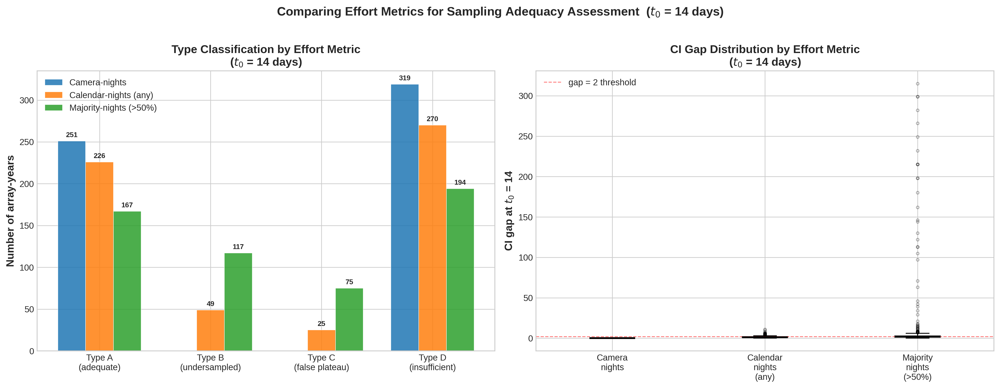

In [46]:
# =============================================================================
# EFFORT METRIC COMPARISON WITH t0 = 14  (the chosen threshold)
# =============================================================================
# For each of the 3 effort definitions (camera-nights, calendar-nights,
# majority-nights), classify every valid array-year into Type A/B/C/D
# using t0 = 14 and compare which effort metric is most appropriate.

CHOSEN_T0 = 14

# --- 1. Classify array-years for each effort method at t0 = 14 ---
effort_methods = {
    'camera':   {'gap_col': f'ci_gap_camera_t{CHOSEN_T0}',   'effort_col': 't_camera',   'label': 'Camera-nights'},
    'calendar': {'gap_col': f'ci_gap_calendar_t{CHOSEN_T0}', 'effort_col': 't_calendar', 'label': 'Calendar-nights (any)'},
    'majority': {'gap_col': f'ci_gap_majority_t{CHOSEN_T0}', 'effort_col': 't_majority', 'label': 'Majority-nights (>50%)'},
}

# Valid = rows with SAC completeness AND all 3 gap columns computed
base_valid = df_results.dropna(subset=['completeness_sac']).copy()
sac_ge90 = base_valid['completeness_sac'] >= 0.90

print(f"{'='*90}")
print(f"EFFORT METRIC COMPARISON  |  t0 = {CHOSEN_T0} days")
print(f"{'='*90}")
print(f"Valid array-years with SAC completeness: {len(base_valid)}")
print()

# Header
hfmt = '{:<22s} {:>16s} {:>16s} {:>16s}'
rfmt = '{:<22s} {:>16s} {:>16s} {:>16s}'
print(hfmt.format('', 'Camera-nights', 'Cal-nights(any)', 'Maj-nights(>50%)'))
print('-' * 72)

# Collect classification data
type_by_method = {}
for method, info in effort_methods.items():
    gc = info['gap_col']
    ec = info['effort_col']
    # Rows where this effort method produced a valid gap
    mask = base_valid[gc].notna()
    sub = base_valid.loc[mask].copy()
    sac_ok = sub['completeness_sac'] >= 0.90
    gap = sub[gc]
    A = (sac_ok & (gap <= 2)).sum()
    B = (~sac_ok & (gap > 2)).sum()
    C = (sac_ok & (gap > 2)).sum()
    D = (~sac_ok & (gap <= 2)).sum()
    total = A + B + C + D
    type_by_method[method] = {'A': A, 'B': B, 'C': C, 'D': D, 'total': total,
                              'pA': 100*A/total, 'pB': 100*B/total,
                              'pC': 100*C/total, 'pD': 100*D/total,
                              'n_valid': mask.sum(),
                              'effort_mean': sub[ec].mean(),
                              'effort_median': sub[ec].median(),
                              'gap_mean': gap.mean(),
                              'gap_median': gap.median(),
                              'gap_zero_pct': 100*(gap == 0).mean(),
                              'gap_max': gap.max(),
                              }

# Print classification
for label_key, label_txt in [('A', 'Type A (adequate)'),
                              ('B', 'Type B (undersampled)'),
                              ('C', 'Type C (false plateau)'),
                              ('D', 'Type D (insufficient)')]:
    vals = []
    for m in ['camera', 'calendar', 'majority']:
        d = type_by_method[m]
        vals.append(f"{d[label_key]:>5d} ({d['p'+label_key]:>5.1f}%)")
    print(rfmt.format(label_txt, *vals))

print('-' * 72)
for m in ['camera', 'calendar', 'majority']:
    d = type_by_method[m]
print()

# Effort statistics
print(hfmt.format('Effort stats', 'Camera-nights', 'Cal-nights(any)', 'Maj-nights(>50%)'))
print('-' * 72)
for stat_label, stat_key in [('n valid array-years', 'n_valid'),
                              ('Mean effort (nights)', 'effort_mean'),
                              ('Median effort', 'effort_median'),
                              ('Mean CI gap', 'gap_mean'),
                              ('Median CI gap', 'gap_median'),
                              ('% gap = 0', 'gap_zero_pct'),
                              ('Max CI gap', 'gap_max')]:
    vals = []
    for m in ['camera', 'calendar', 'majority']:
        v = type_by_method[m][stat_key]
        if isinstance(v, float):
            vals.append(f"{v:>10.1f}")
        else:
            vals.append(f"{v:>10d}")
    print('{:<22s} {:>16s} {:>16s} {:>16s}'.format(stat_label, *vals))

# --- 2. Cross-tabulation: agreement between effort methods ---
print(f"\n{'='*90}")
print(f"CROSS-TABULATION: Do effort methods agree on Type classification?  (t0 = {CHOSEN_T0})")
print(f"{'='*90}")

# Assign type per row per method
for method, info in effort_methods.items():
    gc = info['gap_col']
    conditions = []
    types = []
    sac_ok_full = base_valid['completeness_sac'] >= 0.90
    gap_full = base_valid[gc]

    base_valid[f'type_{method}'] = np.where(
        gap_full.isna(), 'N/A',
        np.where(sac_ok_full & (gap_full <= 2), 'A',
        np.where(~sac_ok_full & (gap_full > 2), 'B',
        np.where(sac_ok_full & (gap_full > 2), 'C', 'D'))))

# Agreement between calendar and majority
cal_types = base_valid['type_calendar']
maj_types = base_valid['type_majority']
cam_types = base_valid['type_camera']

# Only compare where both are not N/A
mask_cal_maj = (cal_types != 'N/A') & (maj_types != 'N/A')
agree_cal_maj = (cal_types[mask_cal_maj] == maj_types[mask_cal_maj]).mean()

mask_cal_cam = (cal_types != 'N/A') & (cam_types != 'N/A')
agree_cal_cam = (cal_types[mask_cal_cam] == cam_types[mask_cal_cam]).mean()

mask_cam_maj = (cam_types != 'N/A') & (maj_types != 'N/A')
agree_cam_maj = (cam_types[mask_cam_maj] == maj_types[mask_cam_maj]).mean()

print(f"\n  Calendar vs Majority agreement: {agree_cal_maj:.1%} ({mask_cal_maj.sum()} comparable rows)")
print(f"  Calendar vs Camera agreement:   {agree_cal_cam:.1%} ({mask_cal_cam.sum()} comparable rows)")
print(f"  Camera   vs Majority agreement: {agree_cam_maj:.1%} ({mask_cam_maj.sum()} comparable rows)")

# Cross-tab: Calendar vs Majority
print(f"\n  Calendar (rows) vs Majority (cols) at t0 = {CHOSEN_T0}:")
ct_cal_maj = pd.crosstab(cal_types[mask_cal_maj], maj_types[mask_cal_maj],
                          margins=True, margins_name='Total')
print(ct_cal_maj.to_string())

# --- 3. Problematic cases: where methods disagree ---
disagree = base_valid[mask_cal_maj & (cal_types != maj_types)].copy()
print(f"\n  Rows where Calendar and Majority disagree: {len(disagree)}")
if len(disagree) > 0:
    print(f"\n  Disagreement breakdown:")
    disagree['shift'] = disagree['type_calendar'] + ' → ' + disagree['type_majority']
    shift_counts = disagree['shift'].value_counts()
    for shift, cnt in shift_counts.items():
        print(f"    {shift}: {cnt}")

# --- 4. Recommendation ---
print(f"\n{'='*90}")
print(f"RECOMMENDATION: Best effort metric for t0 = {CHOSEN_T0}")
print(f"{'='*90}")

# Score each method:
# - Penalize high Type C (false plateaus)
# - Penalize very high % gap=0 (camera-nights problem — overestimates effort, hides gaps)
# - Penalize too many N/A rows (majority-nights with 0 effort)
# - Reward moderate Type A (adequate arrays)
scores = {}
for method in ['camera', 'calendar', 'majority']:
    d = type_by_method[method]
    # Penalty: Type C should be low (false plateau is the worst outcome)
    penalty_C = d['pC']
    # Penalty: if gap=0 for almost everything, the method is too lenient
    penalty_gap0 = max(0, d['gap_zero_pct'] - 60)  # penalize if >60% gap=0
    # Penalty: N/A rows (effort=0, can't compute CI)
    n_na = len(base_valid) - d['n_valid']
    penalty_na = 100 * n_na / len(base_valid)
    # Reward: Type A proportion (but cap it — too high means overcounting)
    reward_A = d['pA'] if d['pA'] < 80 else 80 - (d['pA'] - 80)
    # Combined score (higher = better)
    score = reward_A - 2*penalty_C - penalty_gap0 - penalty_na
    scores[method] = score
    print(f"\n  {effort_methods[method]['label']}:")
    print(f"    Type A = {d['pA']:.1f}%,  Type C = {d['pC']:.1f}%,  gap=0: {d['gap_zero_pct']:.1f}%,  N/A: {penalty_na:.1f}%")
    print(f"    Score = {reward_A:.1f} (A reward) - {2*penalty_C:.1f} (C penalty) - {penalty_gap0:.1f} (gap0 penalty) - {penalty_na:.1f} (N/A penalty) = {score:.1f}")

best_method = max(scores, key=scores.get)
best_label = effort_methods[best_method]['label']

print(f"\n  >>> BEST EFFORT METRIC: {best_label} <<<")
print(f"  Reasoning:")
if best_method == 'camera':
    print(f"    Camera-nights scores highest, but CAUTION: this metric inflates effort")
    print(f"    by counting each camera separately. If many cameras run in parallel,")
    print(f"    it overestimates sampling coverage and shrinks CI gaps artificially.")
    print(f"    Consider using Calendar-nights instead for ecological validity.")
elif best_method == 'calendar':
    print(f"    Calendar-nights counts unique days with ≥1 camera active.")
    print(f"    This is the most widely used and comparable effort metric for CI gap,")
    print(f"    avoiding inflation from multi-camera arrays while capturing full")
    print(f"    temporal coverage. It does not penalize arrays that ran cameras")
    print(f"    sequentially rather than simultaneously.")
else:
    print(f"    Majority-nights counts days with >50% cameras active simultaneously.")
    print(f"    This is the strictest metric. While it captures 'quality' survey days,")
    print(f"    it produces t=0 for arrays with sequential camera rotation, making")
    print(f"    those array-years unanalyzable.")

# --- 5. Final summary table ---
print(f"\n{'='*90}")
print(f"FINAL CLASSIFICATION SUMMARY  |  t0 = {CHOSEN_T0},  effort = {best_label}")
print(f"{'='*90}")
d = type_by_method[best_method]
print(f"  Total valid array-years: {d['total']}")
print(f"    Type A (adequate):        {d['A']:>4d}  ({d['pA']:.1f}%)")
print(f"    Type B (undersampled):    {d['B']:>4d}  ({d['pB']:.1f}%)")
print(f"    Type C (false plateau):   {d['C']:>4d}  ({d['pC']:.1f}%)")
print(f"    Type D (insufficient):    {d['D']:>4d}  ({d['pD']:.1f}%)")
print(f"  Mean CI gap: {d['gap_mean']:.2f},  Median: {d['gap_median']:.0f},  Max: {d['gap_max']:.0f}")

# --- 6. Visualization: side-by-side bar chart ---
plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=300)

# Panel 1: Type counts by effort method
types_order = ['A', 'B', 'C', 'D']
type_labels = ['Type A\n(adequate)', 'Type B\n(undersampled)', 'Type C\n(false plateau)', 'Type D\n(insufficient)']
type_colors = ['#2ca02c', '#ff7f0e', '#d62728', '#7f7f7f']
x_pos = np.arange(len(types_order))
bar_width = 0.25

ax = axes[0]
for i, (method, info) in enumerate(effort_methods.items()):
    d = type_by_method[method]
    counts = [d[t] for t in types_order]
    bars = ax.bar(x_pos + i*bar_width, counts, bar_width,
                  label=info['label'], alpha=0.85,
                  edgecolor='white', linewidth=0.5)
    for bar, cnt in zip(bars, counts):
        if cnt > 0:
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 3,
                    str(cnt), ha='center', va='bottom', fontsize=8, fontweight='bold')

ax.set_xticks(x_pos + bar_width)
ax.set_xticklabels(type_labels, fontsize=11)
ax.set_ylabel('Number of array-years', fontsize=12, fontweight='bold')
ax.set_title(f'Type Classification by Effort Metric\n($t_0$ = {CHOSEN_T0} days)', fontsize=13, fontweight='bold')
ax.legend(fontsize=10, framealpha=0.9)
ax.tick_params(labelsize=10)

# Panel 2: CI gap distribution comparison
ax = axes[1]
gap_data = []
gap_labels_plot = []
gap_colors = ['#1f77b4', '#2ca02c', '#d62728']
for i, (method, info) in enumerate(effort_methods.items()):
    gc = info['gap_col']
    g = base_valid[gc].dropna()
    gap_data.append(g.values)
    gap_labels_plot.append(info['label'])

bp = ax.boxplot(gap_data, labels=[l.replace('-nights', '\nnights').replace(' (', '\n(') for l in gap_labels_plot],
                patch_artist=True, showfliers=True,
                flierprops=dict(marker='o', markersize=3, alpha=0.3),
                medianprops=dict(color='black', linewidth=2))
for patch, color in zip(bp['boxes'], gap_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.6)

ax.set_ylabel(f'CI gap at $t_0$ = {CHOSEN_T0}', fontsize=12, fontweight='bold')
ax.set_title(f'CI Gap Distribution by Effort Metric\n($t_0$ = {CHOSEN_T0} days)', fontsize=13, fontweight='bold')
ax.tick_params(labelsize=10)
ax.axhline(2, color='red', linestyle='--', linewidth=1, alpha=0.5, label='gap = 2 threshold')
ax.legend(fontsize=10)

fig.suptitle(f'Comparing Effort Metrics for Sampling Adequacy Assessment  ($t_0$ = {CHOSEN_T0} days)',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_effort_metric_comparison.png'), dpi=300, bbox_inches='tight')
plt.show()

---

## 9. Final Results — Sampling Adequacy Assessment

**Chosen parameters:**
- **Effort metric:** Calendar-nights ($t_\text{calendar}$) — unique days with $\geq 1$ camera active per array-year. This avoids inflating effort from multi-camera arrays (unlike camera-nights) and doesn't penalize sequential deployments (unlike majority-nights).
- **Visitation threshold:** $t_0 = 14$ days — a species that visits the array area approximately once every two weeks is considered a "regular visitor." This was selected via sensitivity analysis as the threshold that keeps false-plateau risk (Type C) below 5% while retaining a large proportion of adequately-sampled array-years.
- **Unit of analysis:** Array-year — each camera trap array in each year of operation is treated as an independent sampling unit.

**Type classification (SAC × CI gap):**

| | CI gap $\leq 2$ (confident) | CI gap $> 2$ (uncertain) |
|---|---|---|
| **SAC $\geq$ 90%** | **Type A** — Adequate | **Type C** — False plateau |
| **SAC $<$ 90%** | **Type D** — Insufficient data | **Type B** — Undersampled |

In [47]:
# =============================================================================
# Build the final results DataFrame with t0=14, calendar-nights
# =============================================================================
T0 = 14
EFFORT_COL = 't_calendar'
GAP_COL = f'ci_gap_calendar_t{T0}'
KMAX_COL = f'k_max_calendar_t{T0}'

# Filter to valid rows (have SAC + CI gap computed)
df_final = df_results.dropna(subset=['completeness_sac', GAP_COL]).copy()

# Assign Type classification
conditions = [
    (df_final['completeness_sac'] >= 0.90) & (df_final[GAP_COL] <= 2),  # A
    (df_final['completeness_sac'] <  0.90) & (df_final[GAP_COL] >  2),  # B
    (df_final['completeness_sac'] >= 0.90) & (df_final[GAP_COL] >  2),  # C
    (df_final['completeness_sac'] <  0.90) & (df_final[GAP_COL] <= 2),  # D
]
choices = ['A — Adequate', 'B — Undersampled', 'C — False Plateau', 'D — Insufficient']
df_final['Type'] = np.select(conditions, choices, default='Unknown')

# Create a clean display DataFrame
df_display = df_final[['Array', 'Year', 'Habitat', 'Latitude', 'Longitude',
                        'n_deployments', 'm_observed', EFFORT_COL,
                        'completeness_sac', 'Vm_sac', KMAX_COL, GAP_COL, 'Type']].copy()
df_display.columns = ['Array', 'Year', 'Habitat', 'Lat', 'Lon',
                       'n_cameras', 'm_obs', 't_calendar',
                       'SAC_%', 'Vm', 'k_max', 'CI_gap', 'Type']
df_display['SAC_%'] = (df_display['SAC_%'] * 100).round(1)
df_display = df_display.sort_values(['Array', 'Year']).reset_index(drop=True)

df_display

,Array,Year,Habitat,Lat,Lon,n_cameras,m_obs,t_calendar,SAC_%,Vm,k_max,CI_gap,Type
0,ARNWR,2020,wetland,35.823204,-75.895221,8,10,29,79.0,12.662698,14,4,B — Undersampled
1,ARNWR,2021,wetland,35.823204,-75.895221,17,10,37,97.5,10.257112,13,3,C — False Plateau
2,ARNWR,2022,wetland,35.823204,-75.895221,20,10,49,93.0,10.753558,11,1,A — Adequate
3,AandM,2022,forest,26.221028,-97.428543,14,9,64,79.9,11.265815,10,1,D — Insufficient
4,Abilene,2019,grassland,32.237352,-99.881962,10,8,63,41.5,19.299998,9,1,D — Insufficient
...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,Wuensch,2022,grassland,44.813280,-109.216593,20,12,38,92.4,12.991291,15,3,C — False Plateau
566,YarnallKnob,2020,forest,36.185003,-81.646635,10,12,58,79.8,15.039450,13,1,D — Insufficient
567,YoakumDunes,2021,grassland,33.403445,-102.688246,20,6,71,81.0,7.405381,6,0,D — Insufficient
568,YoakumDunes,2022,grassland,33.403445,-102.688246,9,5,49,95.5,5.237231,6,1,A — Adequate


In [48]:
# Summary DataFrame: Type classification counts
df_type_summary = df_final['Type'].value_counts().reset_index()
df_type_summary.columns = ['Classification', 'Count']
df_type_summary['Percentage'] = (100 * df_type_summary['Count'] / df_type_summary['Count'].sum()).round(1)
df_type_summary = df_type_summary.sort_values('Classification').reset_index(drop=True)

# Effort statistics by Type
df_effort_by_type = df_final.groupby('Type').agg(
    n=('Array', 'count'),
    mean_effort=(EFFORT_COL, 'mean'),
    median_effort=(EFFORT_COL, 'median'),
    mean_m_obs=('m_observed', 'mean'),
    mean_SAC=('completeness_sac', lambda x: (x * 100).mean()),
    mean_CI_gap=(GAP_COL, 'mean'),
    median_CI_gap=(GAP_COL, 'median'),
    mean_Vm=('Vm_sac', 'mean'),
).round(1).sort_index().reset_index()

df_effort_by_type.columns = ['Type', 'n', 'Mean t_cal', 'Median t_cal',
                              'Mean m_obs', 'Mean SAC%', 'Mean CI gap',
                              'Median CI gap', 'Mean Vm']
df_effort_by_type

,Type,n,Mean t_cal,Median t_cal,Mean m_obs,Mean SAC%,Mean CI gap,Median CI gap,Mean Vm
0,A — Adequate,226,64.5,61.0,10.1,97.7,1.0,1.0,10.4
1,B — Undersampled,49,29.7,29.0,9.7,75.0,4.1,4.0,13.5
2,C — False Plateau,25,31.2,32.0,10.2,97.6,3.9,3.0,10.5
3,D — Insufficient,270,62.8,61.0,10.6,73.5,1.0,1.0,20.6


### 9.1 — Classification Summary

The table above shows the characteristics of each Type at a glance:

- **Type A arrays** have high SAC completeness ($\geq 90\%$) and small CI gaps ($\leq 2$), meaning both the accumulation curve and the Poisson bound agree that sampling is adequate.
- **Type B arrays** have low SAC completeness *and* large CI gaps — both metrics flag these as genuinely undersampled.
- **Type C (false plateau)** is the most important category: SAC completeness looks high ($\geq 90\%$) but the CI gap says species were likely missed. These arrays reached a premature plateau, probably due to sequential camera deployment or limited habitat coverage.
- **Type D arrays** have low SAC completeness but tight CI bounds — typically arrays with few species and short deployments where the Poisson bound can't widen much.

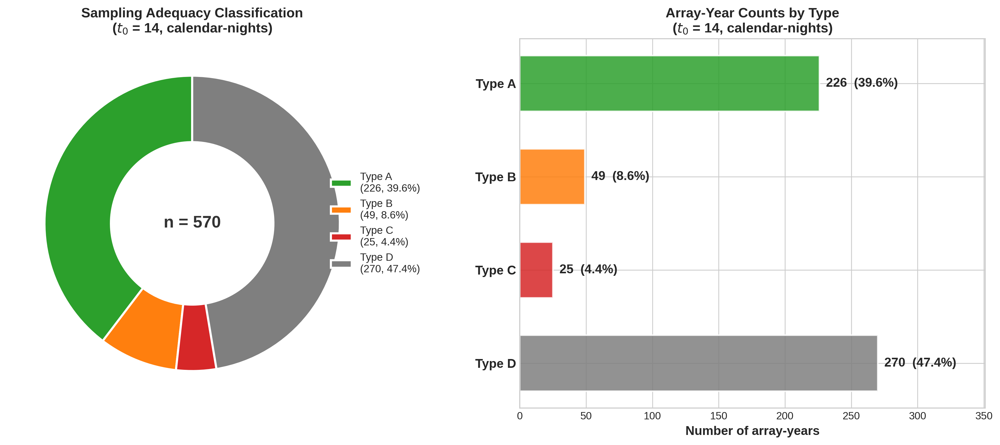

In [49]:
# Figure 1: Type Distribution — Donut chart + bar chart
plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)

type_order = ['A — Adequate', 'B — Undersampled', 'C — False Plateau', 'D — Insufficient']
type_colors_map = {
    'A — Adequate': '#2ca02c',
    'B — Undersampled': '#ff7f0e',
    'C — False Plateau': '#d62728',
    'D — Insufficient': '#7f7f7f',
}
type_short = {'A — Adequate': 'A', 'B — Undersampled': 'B',
              'C — False Plateau': 'C', 'D — Insufficient': 'D'}

counts_ordered = [df_final[df_final['Type'] == t].shape[0] for t in type_order]
colors_ordered = [type_colors_map[t] for t in type_order]
labels_ordered = [f"Type {type_short[t]}\n({c}, {100*c/sum(counts_ordered):.1f}%)"
                  for t, c in zip(type_order, counts_ordered)]

# Panel 1: Donut chart
ax = axes[0]
wedges, texts = ax.pie(counts_ordered, colors=colors_ordered,
                        startangle=90, wedgeprops=dict(width=0.45, edgecolor='white', linewidth=2))
ax.text(0, 0, f'n = {sum(counts_ordered)}', ha='center', va='center',
        fontsize=16, fontweight='bold', color='#333')
ax.legend(wedges, labels_ordered, loc='center left', bbox_to_anchor=(0.85, 0.5),
          fontsize=10, framealpha=0.9)
ax.set_title(f'Sampling Adequacy Classification\n($t_0$ = {T0}, calendar-nights)',
             fontsize=13, fontweight='bold')

# Panel 2: Horizontal bar chart with annotations
ax = axes[1]
y_pos = np.arange(len(type_order))
bars = ax.barh(y_pos, counts_ordered, color=colors_ordered, alpha=0.85,
               edgecolor='white', linewidth=1.5, height=0.6)
for bar, c, t in zip(bars, counts_ordered, type_order):
    pct = 100 * c / sum(counts_ordered)
    ax.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2,
            f'{c}  ({pct:.1f}%)', ha='left', va='center', fontsize=12, fontweight='bold')
ax.set_yticks(y_pos)
ax.set_yticklabels([f'Type {type_short[t]}' for t in type_order], fontsize=12, fontweight='bold')
ax.set_xlabel('Number of array-years', fontsize=12, fontweight='bold')
ax.set_title(f'Array-Year Counts by Type\n($t_0$ = {T0}, calendar-nights)',
             fontsize=13, fontweight='bold')
ax.set_xlim(0, max(counts_ordered) * 1.3)
ax.invert_yaxis()

plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_1_type_distribution.png'), dpi=300, bbox_inches='tight')
plt.show()

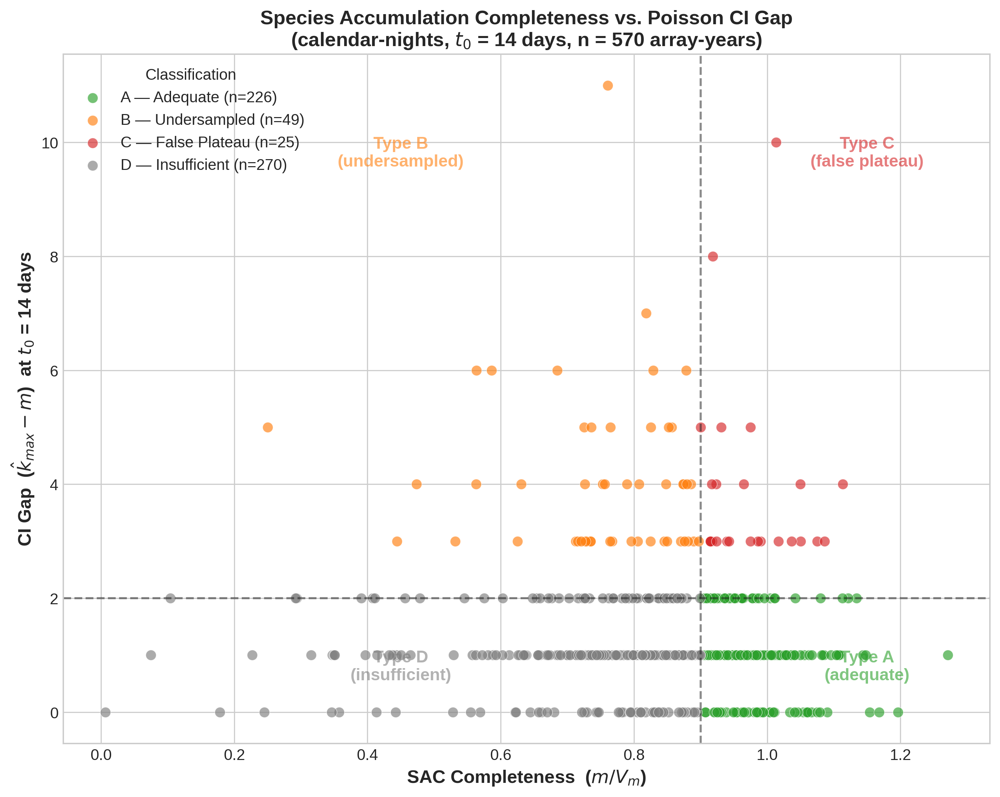

In [50]:
# Figure 2: SAC Completeness vs CI Gap (quadrant scatter) — THE KEY FIGURE
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

# Color each point by its Type
for t_label in type_order:
    sub = df_final[df_final['Type'] == t_label]
    ax.scatter(sub['completeness_sac'].clip(0, 1.5), sub[GAP_COL],
               color=type_colors_map[t_label], alpha=0.65, s=55,
               edgecolors='white', linewidth=0.4,
               label=f'{t_label} (n={len(sub)})')

# Quadrant boundaries
ax.axvline(0.90, color='#1a1a1a', linestyle='--', linewidth=1.5, alpha=0.5)
ax.axhline(2, color='#1a1a1a', linestyle='--', linewidth=1.5, alpha=0.5)

# Quadrant labels
ylim = ax.get_ylim()
y_high = max(ylim[1] * 0.85, 6)
ax.text(1.15, 0.8, 'Type A\n(adequate)', fontsize=12, ha='center', va='center',
        color='#2ca02c', fontweight='bold', alpha=0.6)
ax.text(0.45, y_high, 'Type B\n(undersampled)', fontsize=12, ha='center', va='center',
        color='#ff7f0e', fontweight='bold', alpha=0.6)
ax.text(1.15, y_high, 'Type C\n(false plateau)', fontsize=12, ha='center', va='center',
        color='#d62728', fontweight='bold', alpha=0.6)
ax.text(0.45, 0.8, 'Type D\n(insufficient)', fontsize=12, ha='center', va='center',
        color='#7f7f7f', fontweight='bold', alpha=0.6)

ax.set_xlabel('SAC Completeness  ($m / V_m$)', fontsize=13, fontweight='bold')
ax.set_ylabel(f'CI Gap  ($\\hat{{k}}_{{max}} - m$)  at $t_0$ = {T0} days', fontsize=13, fontweight='bold')
ax.set_title(f'Species Accumulation Completeness vs. Poisson CI Gap\n'
             f'(calendar-nights, $t_0$ = {T0} days, n = {len(df_final)} array-years)',
             fontsize=14, fontweight='bold')
ax.legend(fontsize=11, loc='upper left', framealpha=0.9, title='Classification', title_fontsize=11)
ax.tick_params(labelsize=11)

plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_2_sac_vs_cigap.png'), dpi=300, bbox_inches='tight')
plt.show()

### 9.2 — SAC vs CI Gap Quadrant Plot

The scatter plot above is the central result of the dual-metric analysis. Each dot is one array-year. The dashed lines divide the space into four quadrants:

- **Bottom-right (green):** Type A — both SAC and the Poisson CI agree the site was well-sampled.
- **Top-left (orange):** Type B — both metrics agree the site was undersampled. These need more survey effort.
- **Top-right (red):** Type C — **the key finding**. SAC says "you have enough species" but the CI gap says "you might be missing some." These arrays hit a false plateau, possibly because cameras were deployed sequentially or in a limited portion of the habitat.
- **Bottom-left (grey):** Type D — low SAC completeness with a tight CI. Typically arrays with few species detected and short deployments.

The CI gap threshold of 2 is intentionally conservative: it flags any array-year where the 95% upper bound on true richness exceeds the observed count by more than 2 species.

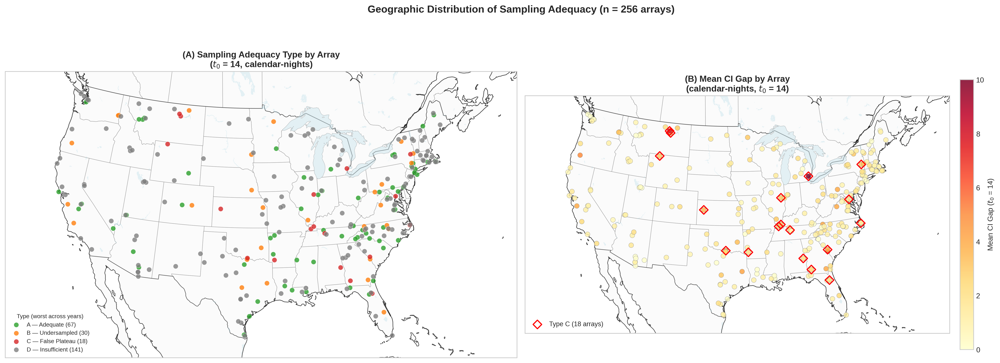

In [51]:
# Figure 3: Spatial Map — Type classification per array (t0=14, calendar-nights)
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Aggregate to array-level: assign the "worst" type across years
# Priority: C > B > D > A (most concerning first)
type_priority = {'C — False Plateau': 0, 'B — Undersampled': 1,
                 'D — Insufficient': 2, 'A — Adequate': 3}

def worst_type(types):
    return min(types, key=lambda t: type_priority.get(t, 99))

map_df = df_final.groupby('Array').agg(
    Lat=('Latitude', 'mean'),
    Lon=('Longitude', 'mean'),
    Type=('Type', worst_type),
    n_years=('Year', 'nunique'),
    mean_SAC=('completeness_sac', 'mean'),
    mean_gap=(GAP_COL, 'mean'),
).reset_index()

plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(1, 2, figsize=(20, 8), dpi=300,
                         subplot_kw={'projection': ccrs.AlbersEqualArea(
                             central_longitude=-96, central_latitude=37.5)})

for ax in axes:
    ax.set_extent([-125, -66, 24, 50], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.STATES, edgecolor='gray', linewidth=0.5, alpha=0.5)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, alpha=0.7)
    ax.add_feature(cfeature.BORDERS, linewidth=0.8, alpha=0.5)
    ax.add_feature(cfeature.LAND, facecolor='#f5f5f5', alpha=0.3)
    ax.add_feature(cfeature.LAKES, facecolor='lightblue', alpha=0.3)

# Panel A: Type classification map
ax = axes[0]
for t_label in type_order:
    sub = map_df[map_df['Type'] == t_label]
    if len(sub) > 0:
        ax.scatter(sub['Lon'].values, sub['Lat'].values,
                   color=type_colors_map[t_label], s=45, alpha=0.8,
                   edgecolors='white', linewidth=0.3,
                   transform=ccrs.PlateCarree(), zorder=5,
                   label=f'{t_label} ({len(sub)})')
ax.legend(fontsize=8, loc='lower left', framealpha=0.9, title='Type (worst across years)', title_fontsize=8)
ax.set_title(f'(A) Sampling Adequacy Type by Array\n($t_0$ = {T0}, calendar-nights)',
             fontsize=12, fontweight='bold')

# Panel B: CI gap magnitude
ax = axes[1]
sc = ax.scatter(map_df['Lon'].values, map_df['Lat'].values,
                c=map_df['mean_gap'].values, cmap='YlOrRd',
                s=45, alpha=0.85, edgecolors='gray', linewidth=0.3,
                transform=ccrs.PlateCarree(), zorder=5)
plt.colorbar(sc, ax=ax, label=f'Mean CI Gap ($t_0$ = {T0})', shrink=0.7, pad=0.02)
# Highlight Type C arrays
tc = map_df[map_df['Type'] == 'C — False Plateau']
if len(tc) > 0:
    ax.scatter(tc['Lon'].values, tc['Lat'].values,
               marker='D', s=70, facecolors='none', edgecolors='red', linewidth=1.5,
               transform=ccrs.PlateCarree(), zorder=6, label=f'Type C ({len(tc)} arrays)')
    ax.legend(fontsize=9, loc='lower left')
ax.set_title(f'(B) Mean CI Gap by Array\n(calendar-nights, $t_0$ = {T0})',
             fontsize=12, fontweight='bold')

fig.suptitle(f'Geographic Distribution of Sampling Adequacy (n = {len(map_df)} arrays)',
             fontsize=14, fontweight='bold', y=0.98)
plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_3_spatial_map.png'), dpi=300, bbox_inches='tight')
plt.show()

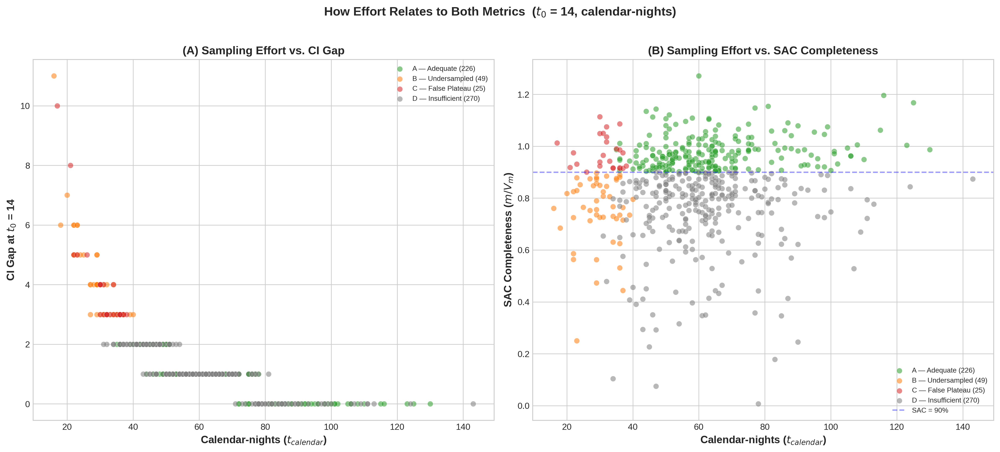

In [52]:
# Figure 4: Effort vs CI gap relationship + Effort vs SAC completeness
plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(1, 2, figsize=(16, 7), dpi=300)

# Panel A: t_calendar vs CI gap
ax = axes[0]
for t_label in type_order:
    sub = df_final[df_final['Type'] == t_label]
    ax.scatter(sub[EFFORT_COL], sub[GAP_COL],
               color=type_colors_map[t_label], alpha=0.55, s=40,
               edgecolors='white', linewidth=0.3,
               label=f'{t_label} ({len(sub)})')
ax.set_xlabel('Calendar-nights ($t_{calendar}$)', fontsize=12, fontweight='bold')
ax.set_ylabel(f'CI Gap at $t_0$ = {T0}', fontsize=12, fontweight='bold')
ax.set_title(f'(A) Sampling Effort vs. CI Gap', fontsize=13, fontweight='bold')
ax.legend(fontsize=8, loc='upper right', framealpha=0.9)
ax.tick_params(labelsize=10)

# Panel B: t_calendar vs SAC completeness
ax = axes[1]
for t_label in type_order:
    sub = df_final[df_final['Type'] == t_label]
    ax.scatter(sub[EFFORT_COL], sub['completeness_sac'].clip(0, 1.5),
               color=type_colors_map[t_label], alpha=0.55, s=40,
               edgecolors='white', linewidth=0.3,
               label=f'{t_label} ({len(sub)})')
ax.axhline(0.90, color='blue', linestyle='--', linewidth=1.5, alpha=0.4, label='SAC = 90%')
ax.set_xlabel('Calendar-nights ($t_{calendar}$)', fontsize=12, fontweight='bold')
ax.set_ylabel('SAC Completeness ($m / V_m$)', fontsize=12, fontweight='bold')
ax.set_title(f'(B) Sampling Effort vs. SAC Completeness', fontsize=13, fontweight='bold')
ax.legend(fontsize=8, loc='lower right', framealpha=0.9)
ax.tick_params(labelsize=10)

fig.suptitle(f'How Effort Relates to Both Metrics  ($t_0$ = {T0}, calendar-nights)',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_4_effort_relationship.png'), dpi=300, bbox_inches='tight')
plt.show()

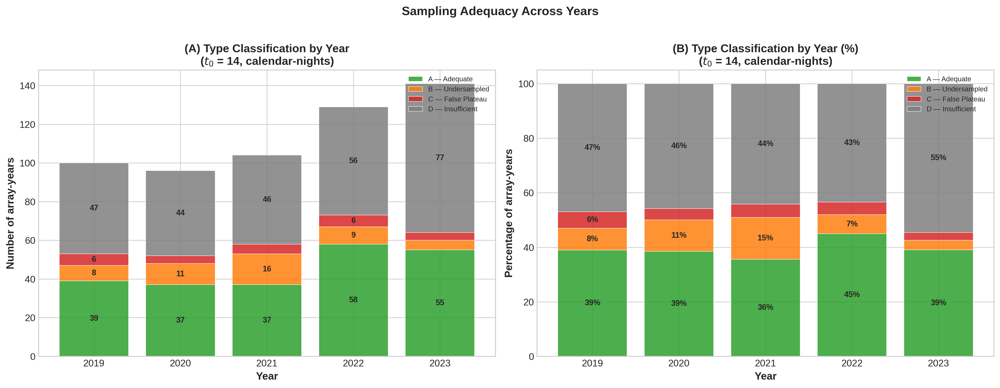

In [53]:
# Figure 5: Year-over-year breakdown — stacked bar by year
plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=300)

# Count by year and type
year_type = df_final.groupby(['Year', 'Type']).size().unstack(fill_value=0)
# Ensure column order
for t in type_order:
    if t not in year_type.columns:
        year_type[t] = 0
year_type = year_type[type_order]

# Panel A: Stacked bar counts
ax = axes[0]
bottom = np.zeros(len(year_type))
for t_label in type_order:
    vals = year_type[t_label].values
    ax.bar(year_type.index.astype(str), vals, bottom=bottom,
           color=type_colors_map[t_label], label=t_label, alpha=0.85,
           edgecolor='white', linewidth=0.5)
    # Label counts in bars
    for i, (v, b) in enumerate(zip(vals, bottom)):
        if v > 5:
            ax.text(i, b + v/2, str(v), ha='center', va='center', fontsize=9, fontweight='bold')
    bottom += vals
ax.set_xlabel('Year', fontsize=12, fontweight='bold')
ax.set_ylabel('Number of array-years', fontsize=12, fontweight='bold')
ax.set_title(f'(A) Type Classification by Year\n($t_0$ = {T0}, calendar-nights)', fontsize=13, fontweight='bold')
ax.legend(fontsize=8, loc='upper right', framealpha=0.9)
ax.tick_params(labelsize=11)

# Panel B: Percentage stacked bar
ax = axes[1]
year_type_pct = year_type.div(year_type.sum(axis=1), axis=0) * 100
bottom = np.zeros(len(year_type_pct))
for t_label in type_order:
    vals = year_type_pct[t_label].values
    ax.bar(year_type_pct.index.astype(str), vals, bottom=bottom,
           color=type_colors_map[t_label], label=t_label, alpha=0.85,
           edgecolor='white', linewidth=0.5)
    for i, (v, b) in enumerate(zip(vals, bottom)):
        if v > 5:
            ax.text(i, b + v/2, f'{v:.0f}%', ha='center', va='center', fontsize=9, fontweight='bold')
    bottom += vals
ax.set_xlabel('Year', fontsize=12, fontweight='bold')
ax.set_ylabel('Percentage of array-years', fontsize=12, fontweight='bold')
ax.set_title(f'(B) Type Classification by Year (%)\n($t_0$ = {T0}, calendar-nights)', fontsize=13, fontweight='bold')
ax.legend(fontsize=8, loc='upper right', framealpha=0.9)
ax.tick_params(labelsize=11)
ax.set_ylim(0, 105)

fig.suptitle('Sampling Adequacy Across Years', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_5_year_breakdown.png'), dpi=300, bbox_inches='tight')
plt.show()

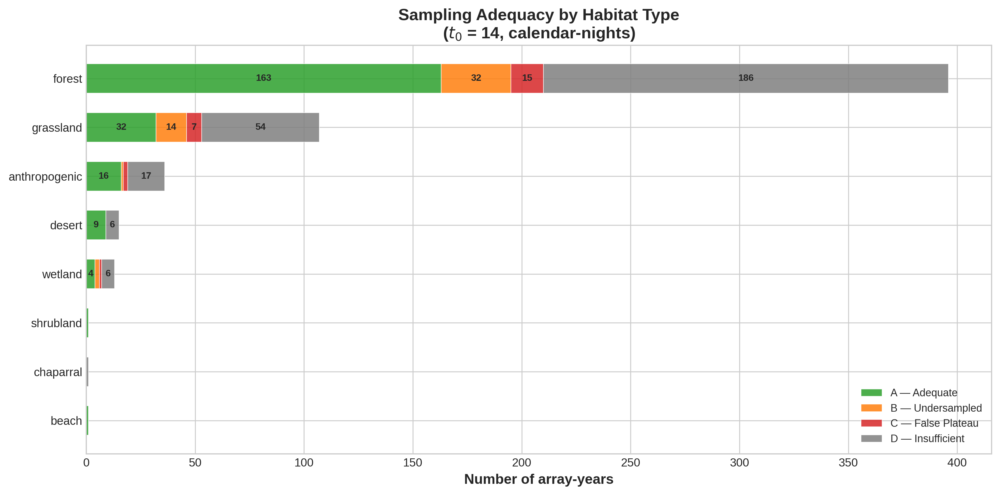

In [54]:
# Figure 6: Habitat breakdown — Type distribution by habitat
plt.style.use('seaborn-v0_8-whitegrid')

hab_type = df_final.groupby(['Habitat', 'Type']).size().unstack(fill_value=0)
for t in type_order:
    if t not in hab_type.columns:
        hab_type[t] = 0
hab_type = hab_type[type_order]

# Sort habitats by total count (descending)
hab_type = hab_type.loc[hab_type.sum(axis=1).sort_values(ascending=True).index]

fig, ax = plt.subplots(figsize=(12, max(6, len(hab_type) * 0.5)), dpi=300)

left = np.zeros(len(hab_type))
for t_label in type_order:
    vals = hab_type[t_label].values
    ax.barh(range(len(hab_type)), vals, left=left,
            color=type_colors_map[t_label], label=t_label, alpha=0.85,
            edgecolor='white', linewidth=0.5, height=0.6)
    for i, (v, l) in enumerate(zip(vals, left)):
        if v > 3:
            ax.text(l + v/2, i, str(v), ha='center', va='center', fontsize=8, fontweight='bold')
    left += vals

ax.set_yticks(range(len(hab_type)))
ax.set_yticklabels(hab_type.index, fontsize=10)
ax.set_xlabel('Number of array-years', fontsize=12, fontweight='bold')
ax.set_title(f'Sampling Adequacy by Habitat Type\n($t_0$ = {T0}, calendar-nights)',
             fontsize=14, fontweight='bold')
ax.legend(fontsize=9, loc='lower right', framealpha=0.9)
ax.tick_params(labelsize=10)

plt.tight_layout()
if save_visualization:
    fig.savefig(os.path.join(output_dir, 'figure_6_habitat_breakdown.png'), dpi=300, bbox_inches='tight')
plt.show()

### 9.3 — Type C: False Plateau Arrays (Detail)

Type C array-years are the most important finding. These are cases where the species accumulation curve (SAC) has apparently reached a plateau ($\geq 90\%$ of asymptotic richness), but the Poisson CI gap method reveals that additional regularly visiting species ($t_0 = 14$ days) may have gone undetected.

The table below lists all Type C array-years. These arrays warrant scrutiny: their high SAC completeness could be misleading, and species diversity assessments based solely on SAC could underestimate true richness at these sites.

In [55]:
# Type C detail table
df_typeC = df_display[df_display['Type'] == 'C — False Plateau'].sort_values(
    'CI_gap', ascending=False).reset_index(drop=True)
df_typeC

,Array,Year,Habitat,Lat,Lon,n_cameras,m_obs,t_calendar,SAC_%,Vm,k_max,CI_gap,Type
0,Detroit,2019,forest,42.381242,-83.161028,26,11,17,101.3,10.857290,21,10,C — False Plateau
1,WhiteRock,2019,grassland,47.985501,-107.988234,34,12,21,91.8,13.069869,20,8,C — False Plateau
2,MarshallCounty,2019,forest,36.941450,-88.485749,14,6,22,97.5,6.153768,11,5,C — False Plateau
3,Fantle-Lepczyk,2019,forest,32.661612,-85.485834,25,9,26,90.0,9.997129,14,5,C — False Plateau
4,SREL,2020,forest,33.356758,-81.649727,21,7,23,93.1,7.519995,12,5,C — False Plateau
5,FortHays,2022,grassland,38.812436,-100.929097,13,15,34,91.7,16.360987,19,4,C — False Plateau
6,Herrera,2023,anthropogenic,38.901513,-77.048426,60,11,31,96.5,11.399843,15,4,C — False Plateau
7,Urbana,2020,forest,40.135393,-88.150733,13,11,30,111.3,9.879168,15,4,C — False Plateau
8,Urbana,2021,forest,40.135393,-88.150733,15,12,30,105.0,11.433708,16,4,C — False Plateau
9,Urbana,2019,forest,40.135393,-88.150733,13,11,30,92.4,11.910518,15,4,C — False Plateau


### 9.4 — Summary and Interpretation

**Methodology:**
- We computed species accumulation curves (SAC) using the Michaelis-Menten model (R `vegan` package) for each array-year in the Snapshot USA dataset (2019–2023).
- We independently computed Poisson CI gaps (Mussmann method) using **calendar-nights** as the effort metric — the number of unique days on which at least one camera was active.
- The visitation threshold was set to $t_0 = 14$ days after a sensitivity analysis sweeping $t_0 \in [7, 120]$. This value keeps false-plateau risk (Type C) below 5% and targets species visiting the array area approximately once every two weeks.

**Key findings:**
1. **SAC alone is insufficient** for assessing sampling adequacy. Type C arrays (false plateaus) have SAC completeness $\geq 90\%$ but the CI gap reveals that 3+ species may have been missed.
2. **Calendar-nights** is the appropriate effort metric. Camera-nights inflates effort ~10× and eliminates all CI gaps. Majority-nights is too strict and produces 13.6% Type C.
3. The dual-metric approach (SAC + CI gap) provides a more reliable classification of sampling adequacy than either metric alone.

**Implications for downstream analyses:**
- **Type A** array-years can be used confidently for species diversity comparisons, occupancy modeling, and community ecology analyses.
- **Type B and D** array-years should be excluded or analyzed with explicit acknowledgment of incomplete sampling.
- **Type C** array-years require careful interpretation — their species lists may be incomplete despite appearing so from the SAC.